<a href="https://colab.research.google.com/github/SimplyDifficult/ML-for-Wireless/blob/main/11.Noisy1_20_dim_user_case_BOGP_p%3D30.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
P_max = 30 #in dBm

In [ ]:
var = 20
number_of_cells = 4

In [ ]:
!sudo add-apt-repository ppa:octave/stable
!sudo apt update
!sudo apt install octave

 The latest version of GNU Octave built for all supported Ubuntu releases. GNU Octave is normally distributed with Ubuntu, this PPA is for you if you have a need to use a newer version of Octave than what you can already get from your installed version of Ubuntu.

Simply follow the instructions below to add this PPA to your system and install the octave package. If it's not that easy or you encounter any errors, contact the team and let us know.

Much credit goes to the Debian Octave Group who maintain the official Debian packages that this work is derived from. Without their efforts to bring Octave packaging to such a high level of quality in Debian and Debian derivatives, this PPA would not be here.
 More info: https://launchpad.net/~octave/+archive/ubuntu/stable
Press [ENTER] to continue or Ctrl-c to cancel adding it.

Get:1 http://security.ubuntu.com/ubuntu bionic-security InRelease [88.7 kB]
Get:2 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ InRelease [3,626 B]
Ign:

In [ ]:
!wget https://www.dropbox.com/s/llve9s3hfamwyni/function_uncorrelated_rayleigh_fading_channel_model.m
!wget https://www.dropbox.com/s/d1ytzzfpxsrpbcv/main_bitchanged.m -O /content/main.m
!wget https://www.dropbox.com/s/v3y2xe56qodthnm/function_SE.m
!wget https://www.dropbox.com/s/5p0j4qdqist7ibm/main_individual_transmit_case_for_Test_phase_bitchanged.m -O /content/main_individual_transmit_case_for_Test_phase.m

In [ ]:
from numpy import arange
from numpy import vstack
from numpy import argmax
from numpy import asarray
from numpy.random import normal
from scipy.stats import norm
from sklearn.gaussian_process import GaussianProcessRegressor
from warnings import catch_warnings
from warnings import simplefilter
from matplotlib import pyplot
from scipy.optimize import minimize
import numpy as np
from scipy.io import loadmat, savemat
import numpy as np
from google.colab import files
import cv2
from scipy.optimize import dual_annealing

In [ ]:
import warnings
warnings.filterwarnings('ignore')

In [ ]:
#### Objective function
import random
def objective(tr_array):
  tr_in_mW = np.power(10,tr_array/10.0)
  savemat("transmit.mat", {"transmit":(tr_in_mW)})
  !octave -W main.m
  SE = loadmat('SE.mat')
  return np.sum(SE["SE"])

In [ ]:
#surrogate or approximation for the objective function
def surrogate(model, X):
	#catch any warning generated when making a prediction
	with catch_warnings():
		#ignore generated warnings
		simplefilter("ignore")
		return model.predict(X, return_std=True)

In [ ]:
def UCBobjective(Xsamples, X, model, beta):
  Xsamples = Xsamples[np.newaxis,:]
  mu, std = surrogate(model, Xsamples)
  mu = mu[:, 0]
  sigma = beta
  probs = mu + sigma * std
  return -probs[0]

In [ ]:
#optimize the acquisition function
def opt_acquisition(X, y, model, iteration):
  #Do it 5 times
  r_min, r_max = -31.0, P_max  
  bounds = []
  for ti in range(var):
    bounds = bounds + [[r_min, r_max]]
  min_result = 9999999999999.0
  min_answer = 0
  if iteration<180:
   beta = 5*np.exp(((-1)*(10+np.log(5))*iteration)/(180*0.43))
  else:
   beta = 0.0000000001
  
  for i in range(5):
    result = dual_annealing(UCBobjective, bounds, args=(X,model,beta))
    if(result.fun<min_result):
      min_result = result.fun
      min_answer = result['x']    
  return min_answer

In [ ]:
import random
def objective_FPA(tr_array):
  tr_in_mW = np.power(10,tr_array/10.0)
  savemat("transmit.mat", {"transmit":(tr_in_mW)})
  !octave -W /content/main_individual_transmit_case_for_Test_phase.m
  SE = loadmat('SE.mat')
  return np.sum(SE["SE"])

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
X = np.load("/content/drive/MyDrive/trainingx_BOGP_noisy_2.npy")
y = np.load("/content/drive/MyDrive/trainingy_BOGP_noisy_2.npy")
y_FPA = np.load("/content/drive/MyDrive/grad_trainingyFPA_BOGP_noisy_2.npy")

x_next is [ -8.75840458 -17.04868331 -23.48896856  28.50918565  14.66726208
  -3.56214008 -20.64177196   2.87522752 -29.48443347 -14.69234833
   7.79655997 -17.28683185   3.86126994  -6.88267118  24.18559544
   2.49679615  24.17072583  15.05692104 -17.49559449 -13.10397153]
f()=0.000000, actual=20.520
0


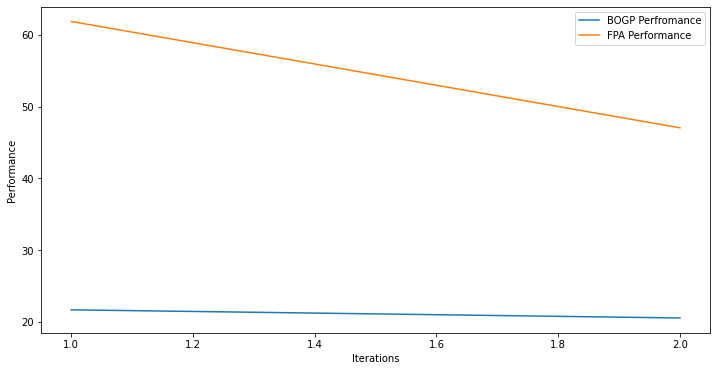

x_next is [ 12.30933635   1.65766618 -29.24053929 -28.97545927  17.84725337
  17.75948685  -3.45864215 -30.65617735  26.06877941 -29.2836691
 -17.6164652  -19.09860505   8.99307708  15.73936716 -23.72855137
 -18.60168108 -20.52902457  24.52017727  -7.69955409   2.98771457]
f()=21.073519, actual=20.304
1


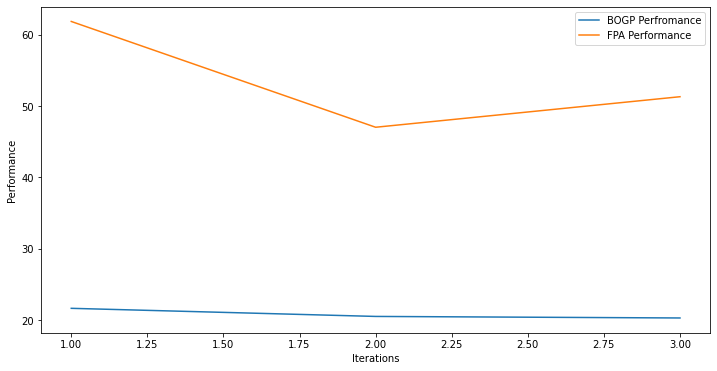

x_next is [ 22.05514294  18.11452439  -2.75067206 -26.26278788  21.42494078
  18.95000349 -26.31086071  23.55548562  21.31801187 -17.10138679
 -28.13132064  26.04595669  12.25945781  24.98906732 -11.35505192
  -1.38669074 -23.0976716  -27.32365754 -30.46153021  15.80715191]
f()=20.818773, actual=36.083
2


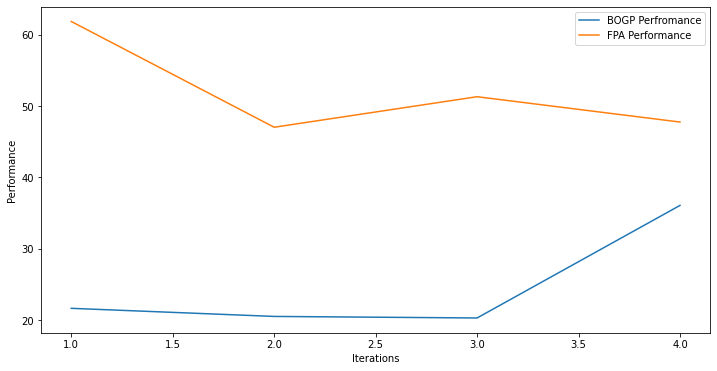

x_next is [ 30.  30.  30. -31.  30. -31. -31.  30. -31. -31. -31.  30. -31.  30.
  30.  30. -31. -31. -31.  30.]
f()=33.807039, actual=24.557
3


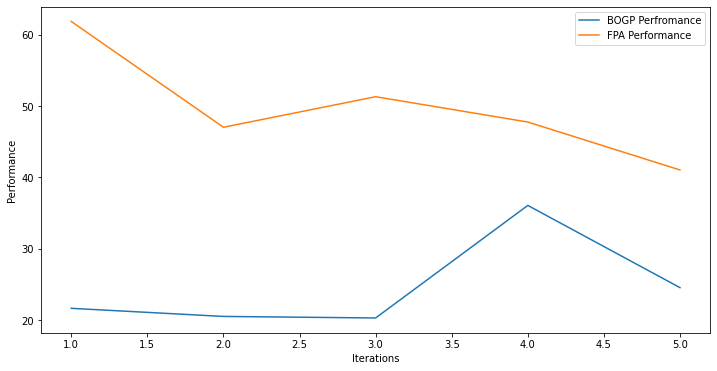

x_next is [-17.43583942  26.8532608    2.22136272  21.96700057  21.12541488
  29.48807715  15.89645804 -29.39569321  -1.49186869   8.23418222
   3.58079559  -8.61183807   1.79703037  -3.43090631  12.01123849
  21.97923956  13.96157398  -7.78747153  15.78426464 -25.68503897]
f()=24.267747, actual=30.420
4


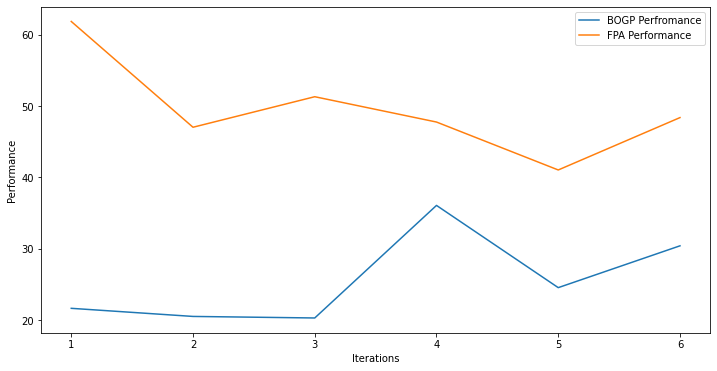

x_next is [-24.3981624   16.40728142  12.34577419 -20.33696672  -7.99951193
  27.31734729  -6.0826397  -16.07879256 -25.07974565 -12.05089345
 -13.85198862 -22.30033397   4.82149062 -20.79673624  16.94631968
  22.73261343 -11.20260659  -9.11447815  13.38337948  -3.97784782]
f()=25.325097, actual=23.118
5


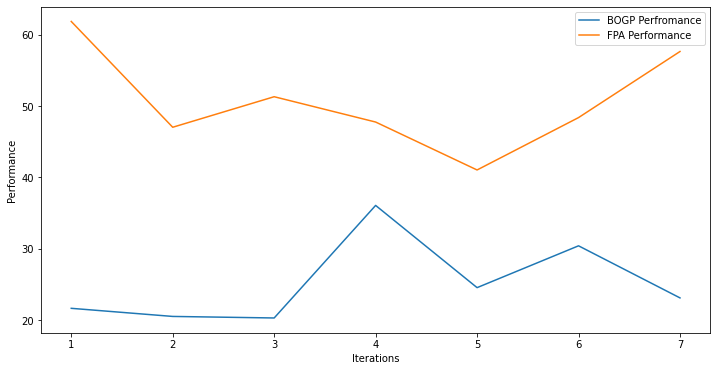

x_next is [-13.47277908  -5.59518679 -13.4173339   20.18023072 -23.67610994
 -13.06312089  -7.09262697 -14.80526289 -20.80230534 -29.37906401
  21.12747633 -28.48233314  13.92288731  -4.81255798 -25.30375618
  -6.30489451  22.76375757  25.53120181   3.33771196   4.0936388 ]
f()=25.040100, actual=25.347
6


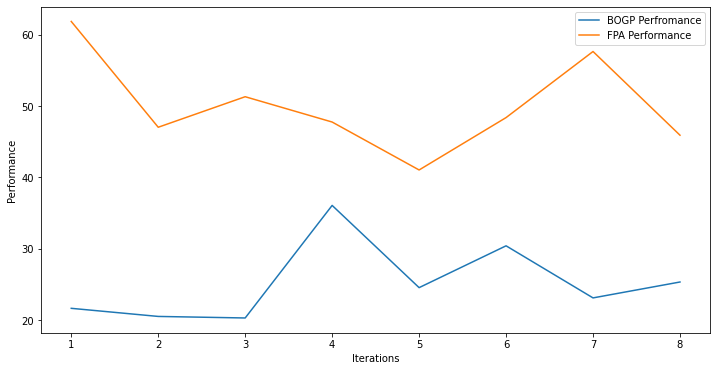

x_next is [  0.72798277 -17.6132431  -29.65563518  17.64202884  15.91894135
  19.64158237  14.52017267  21.67330582   6.15269555  17.39473997
 -14.77025949  15.17026251 -22.5333929   20.30380397 -22.00771675
 -20.16706511   3.57915003  -3.28119238  22.60477903  19.53958786]
f()=25.103191, actual=30.839
7


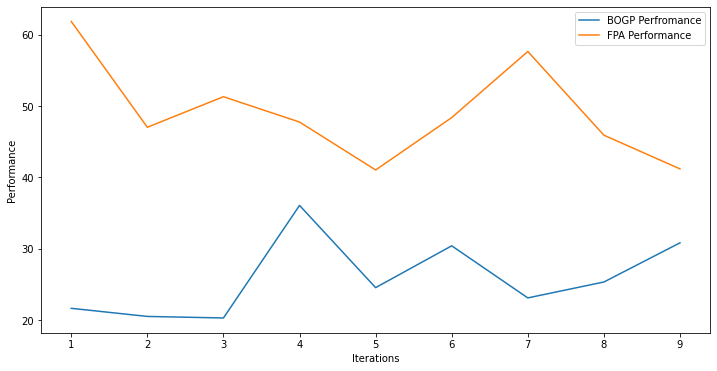

x_next is [-22.42430828  -7.5910194   -6.12105796  23.34445607  19.36402802
   2.9465617   10.9900842  -19.56231651  21.7954905   14.84971759
  27.47663161  -7.07462114  -4.50020866 -29.40825435 -19.30215525
   2.85351753   5.72041439  15.69233575  11.12045246  -2.80867787]
f()=25.744810, actual=25.497
8


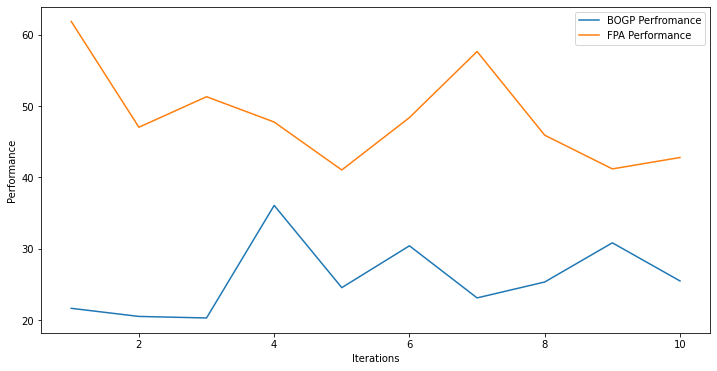

x_next is [-25.19290136  -8.20027557  15.30136033  -9.53610142   1.75040566
 -25.70697191  -4.01627973  20.79513268  29.23180564  26.91996873
 -22.56412972  -5.22674091  11.17836708 -29.77382164  22.85481962
  -6.9308646  -25.14045081 -20.0635261    0.55304444 -26.89380726]
f()=25.732497, actual=21.189
9


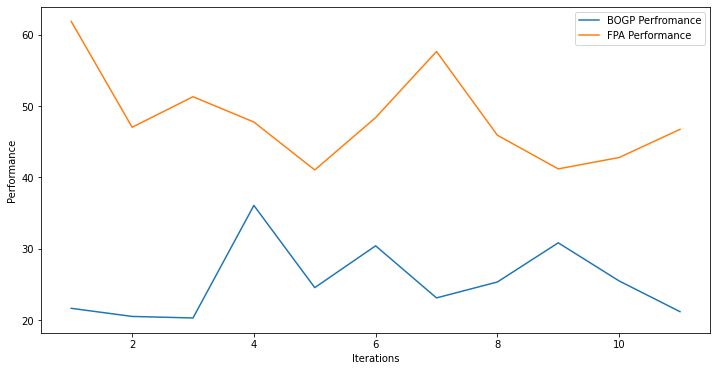

x_next is [ -6.57034064 -17.19473306 -25.18347274 -21.45561368  -1.86154328
  -5.37109873  -7.71544153 -13.24578894   8.50468369  28.54933163
  -7.09270977 -29.86081451  17.41741899 -24.80892962  -5.52618168
  -5.23187693   8.6673079   20.37631249  -1.98925895   8.80063034]
f()=25.320290, actual=18.563
10


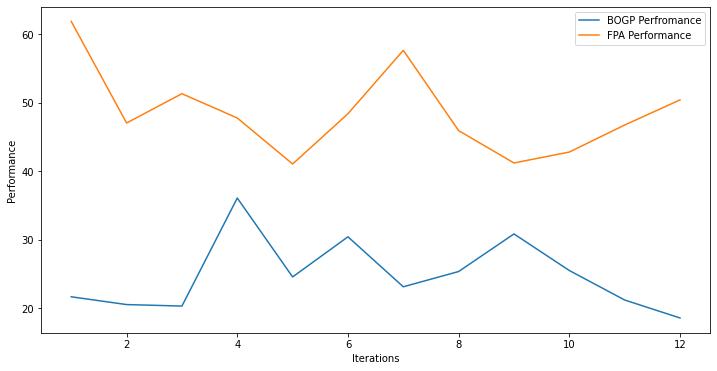

x_next is [  0.17502485 -16.4943388  -15.59280115 -24.0192083    2.72215519
 -25.26333911 -20.05486624  18.33046101  15.04370372  -0.79216191
   8.60887941  17.39595697 -27.77499798   0.26607459  -6.75128773
  17.13895137  -8.95171436 -27.53266299 -18.53231434 -28.0947809 ]
f()=24.749974, actual=29.058
11


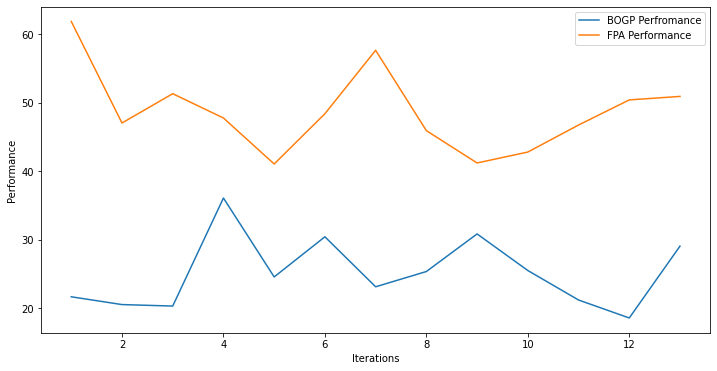

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30. -31. -31.  30. -31.  30.
 -31.  30. -31. -31. -31.  30.]
f()=26.483856, actual=43.014
12


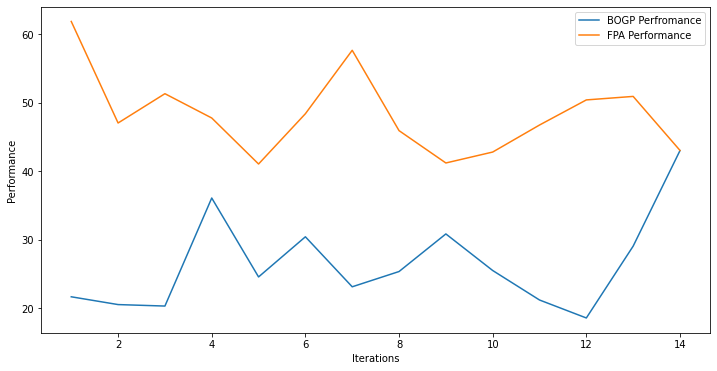

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=40.885980, actual=40.635
13


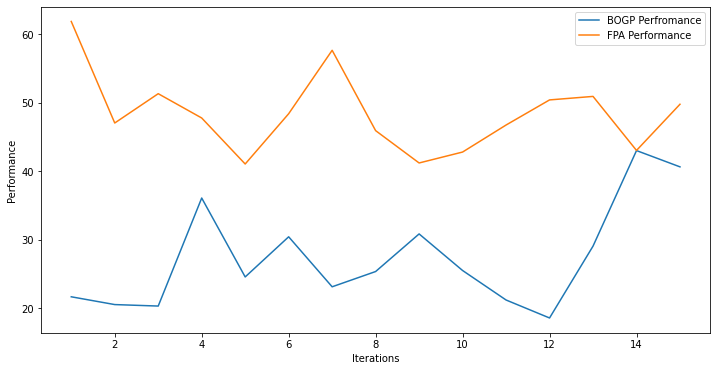

x_next is [ -0.32095519  23.80841057   1.0976709   28.64448348  13.5284328
  -7.60576738  -2.13989534  27.28999922  22.67394617   9.31894228
 -28.30491583 -28.64160761 -28.43223196 -27.44750613  18.49412943
 -20.81630307  -7.08780109 -20.06823036  10.66811524 -25.70489511]
f()=27.247779, actual=24.155
14


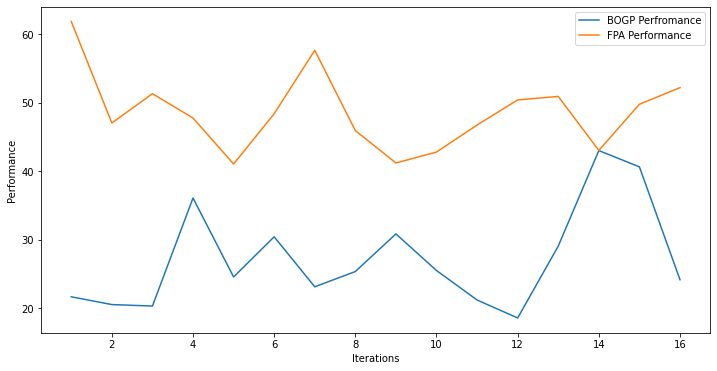

x_next is [ 22.64584218 -26.71513523 -27.29961391  24.33658857   9.6678125
  28.65591056 -26.52653442  -9.03825632  28.03320826   2.65429719
 -13.81161819 -25.81856256  -2.93283837  29.54684194 -26.58557644
   3.07945213  26.13390669   1.64557232 -13.99574474  10.75346447]
f()=27.060790, actual=26.516
15


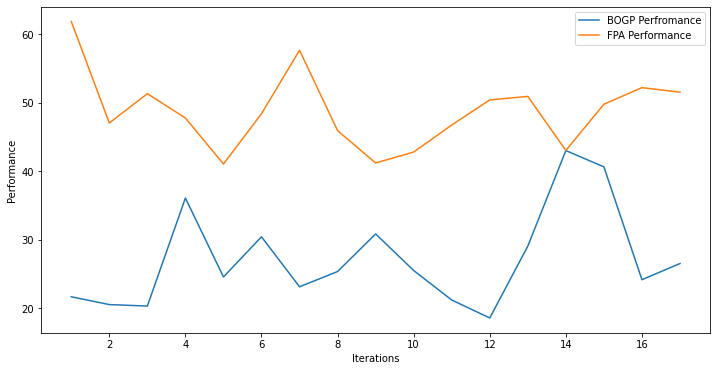

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.  30. -31.  30.
 -31.  30. -31. -31. -31.  30.]
f()=40.800801, actual=36.583
16


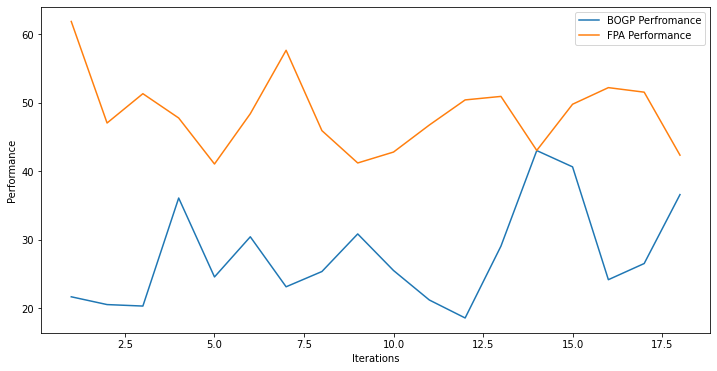

x_next is [ 25.5573331   29.55929443  28.62979447  19.38635283  25.7278261
  29.17884386  21.22189382  26.49245748  23.71583123 -29.98287124
   2.65603276  29.41351448 -28.31758824  27.98815635 -30.567582
  26.7037416  -21.79242011 -29.23401943 -22.87733051  28.63897714]
f()=27.564233, actual=37.822
17


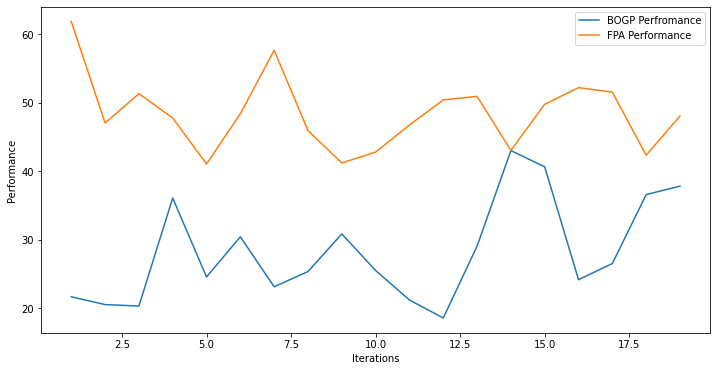

x_next is [ 15.7689711  -16.16723101 -30.37987784  -0.21546673  26.28494036
 -17.74118422  26.53731751 -13.06737865 -11.85424124  25.60608593
  -0.61983048   9.86500101 -12.39608574  -9.56788919   2.53676783
 -26.96211712  26.46244944 -11.47870976  29.93591827 -20.79884925]
f()=28.101337, actual=22.830
18


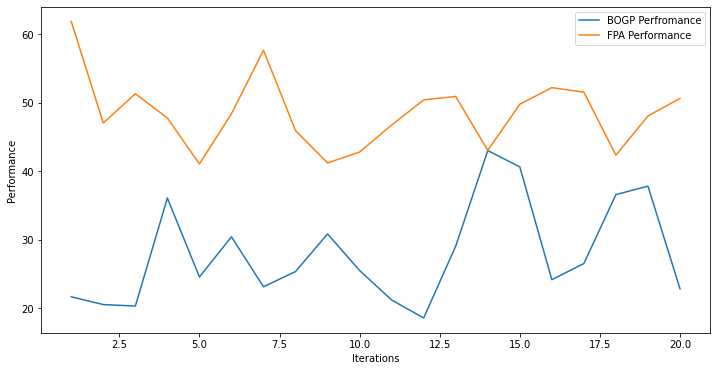

x_next is [  4.7826113  -10.61167924 -20.25720901   4.51561044  -9.96239524
  19.10429521  -3.70617542  -3.72661776   4.07203202 -13.39976224
 -10.54600433  -5.54574546  -5.80235891  -1.62610684  -4.77895815
 -17.42177648   1.74635684  -9.67542203  14.4589136   -8.56031722]
f()=27.839413, actual=20.961
19


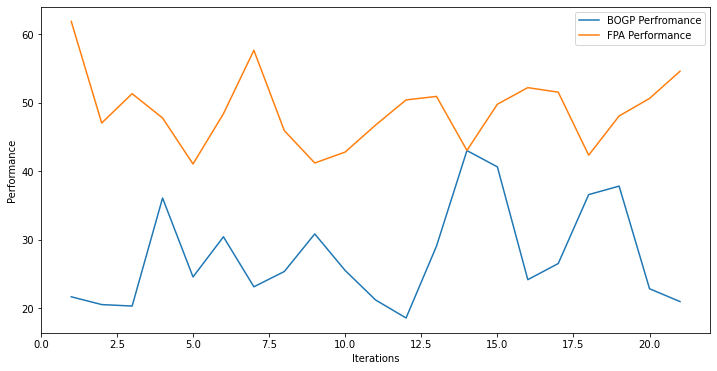

x_next is [-18.77102293  30.          30.          30.          30.
  30.          30.          30.          30.         -31.
 -31.          30.         -31.          30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=40.351209, actual=40.892
20


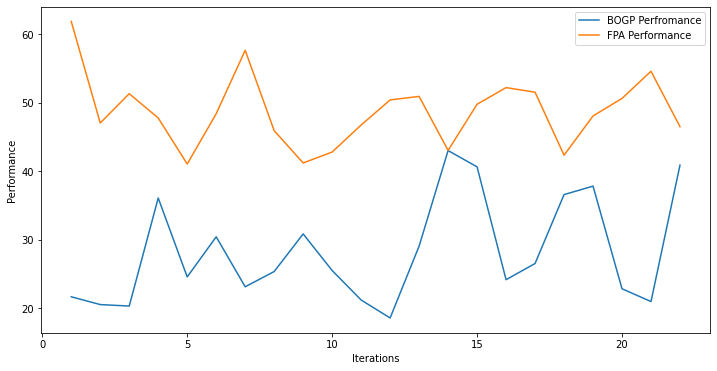

x_next is [ 29.99997818  29.99985218  29.99980727  29.99984255  29.99971635
  29.99998599  29.9998291   29.99981036  29.99997905 -30.99991958
  29.99941793  29.99980277 -30.99977127  29.99981556 -30.99979774
  29.99996922 -30.99965178 -30.99966671 -30.99991418  29.9999784 ]
f()=28.112638, actual=45.636
21


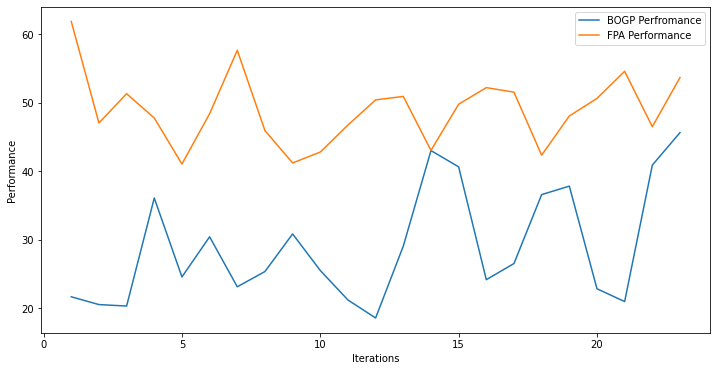

x_next is [ 29.99984342  29.99985194  29.99999816  29.99982824  29.99996255
  29.99987692  29.99998838  29.99999923  29.99999538 -30.99995354
  29.99997461  29.99979664 -30.99995181  29.99988462 -30.99999065
  29.99984    -30.99998861 -30.99985493 -30.9998821   29.99996325]
f()=28.861074, actual=42.692
22


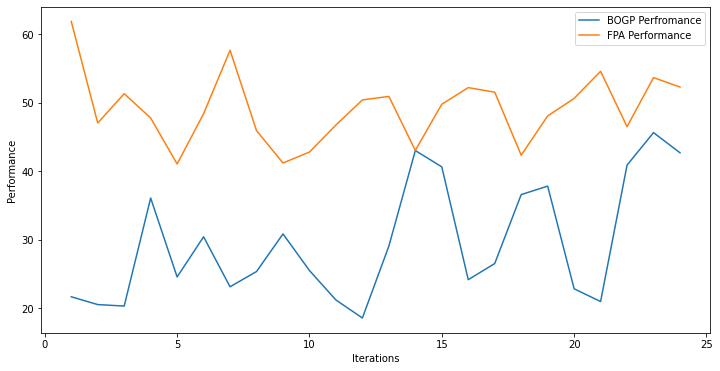

x_next is [ -8.93964855  30.          30.          30.          30.
  30.          30.          30.          30.         -31.
  30.          30.         -31.          30.         -31.
  30.         -12.39937451 -31.         -31.          30.        ]
f()=41.197871, actual=39.844
23


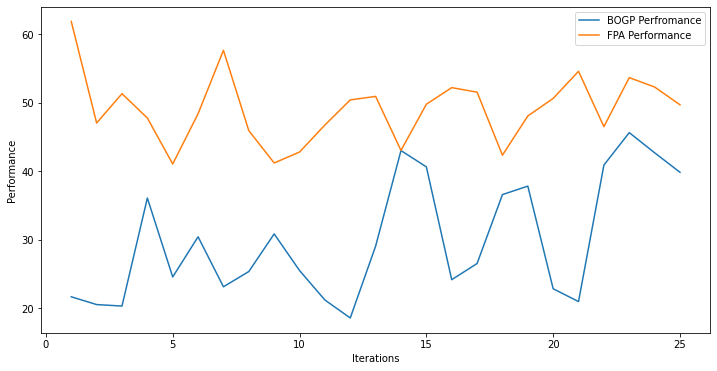

x_next is [ 29.99998284  29.99999997  30.          29.99999997  29.99999332
  29.99979806  29.99992634  29.99994791  29.99985189 -30.99997005
  29.99989886  29.99998133 -30.99992066  29.99944194 -30.99997982
  29.99976788 -30.99992176 -30.99996423 -30.99984692  29.99984215]
f()=29.848812, actual=34.704
24


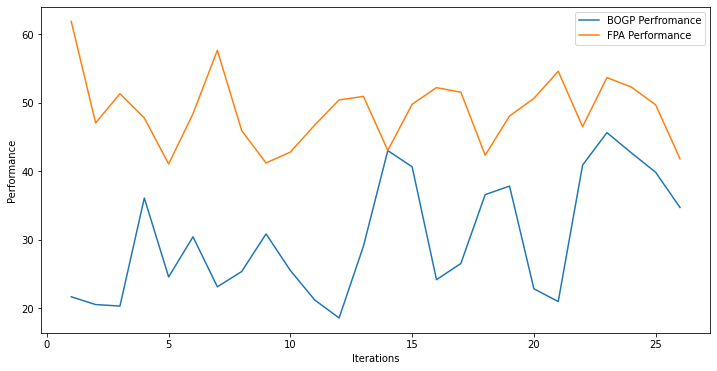

x_next is [  0.25540192  30.          30.          30.          30.
  30.          30.          30.          30.         -31.
  11.23999931  30.         -31.          30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=40.349136, actual=38.026
25


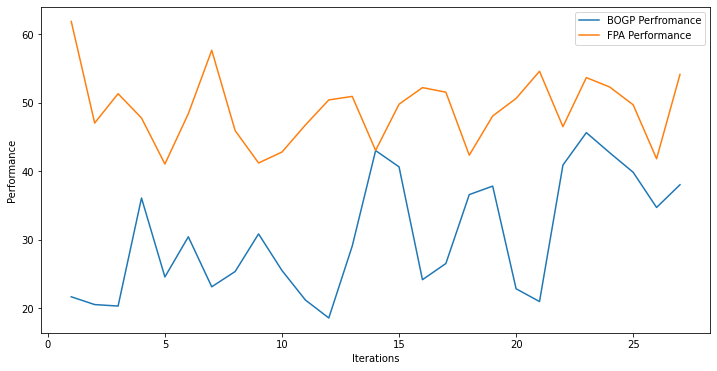

x_next is [ 20.78669476  30.          30.          30.          30.
  30.          30.          30.          30.         -31.
   1.53016311  30.         -31.          30.         -31.
  30.          -5.45623975 -31.         -31.          30.        ]
f()=39.933747, actual=39.471
26


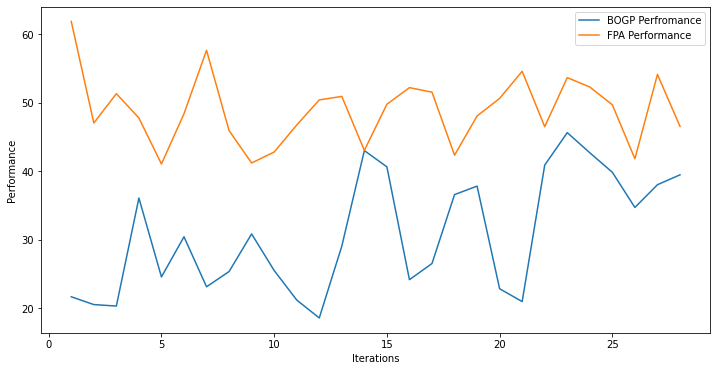

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.         -31.
  30.          30.         -31.          30.         -31.
  30.         -22.20032611 -31.         -31.          30.        ]
f()=38.549418, actual=44.994
27


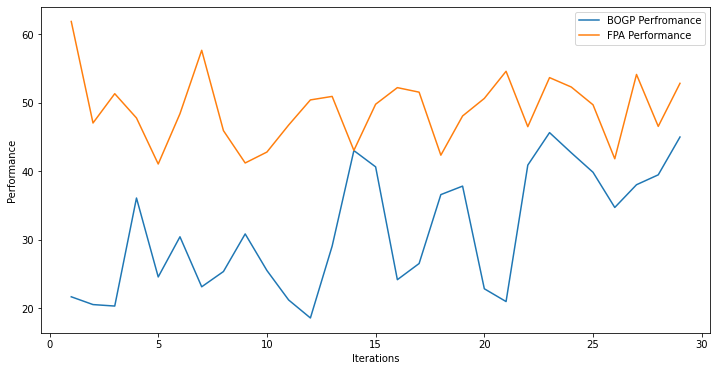

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.         -31.
  30.          30.         -31.          30.         -31.
  30.         -21.42312119 -31.         -31.          30.        ]
f()=40.434071, actual=42.244
28


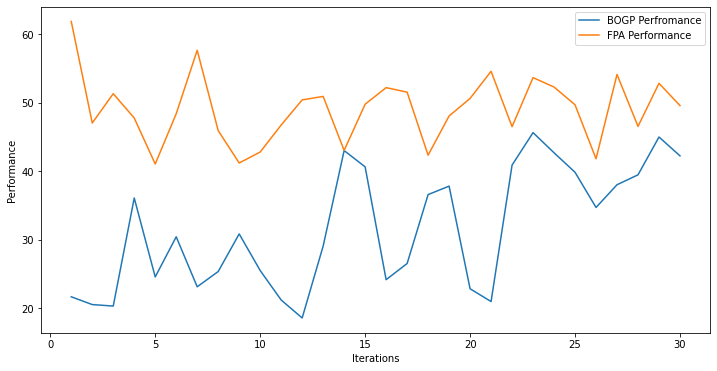

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.         -31.
  30.          30.         -31.          30.         -31.
  30.         -24.84895988 -31.         -31.          30.        ]
f()=40.640053, actual=34.456
29


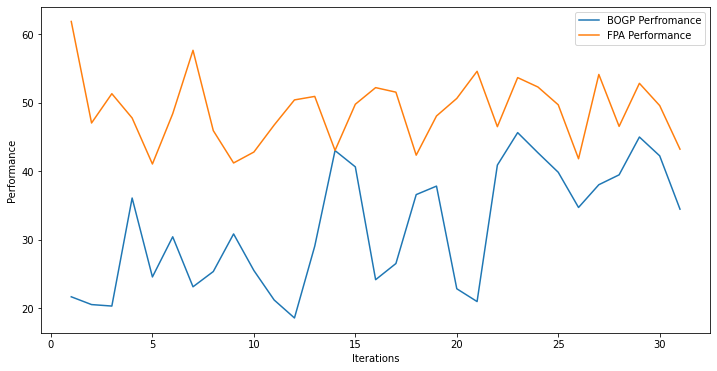

x_next is [ 30.         30.         30.         30.         30.         30.
  30.         30.         30.        -31.         30.         30.
 -31.         30.        -31.         30.         -2.4967151 -31.
 -31.         30.       ]
f()=40.042114, actual=44.443
30


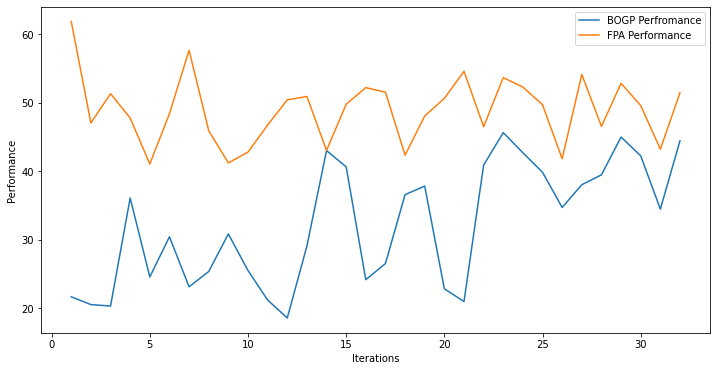

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.         -31.
  30.          30.         -31.          30.         -31.
  30.          19.74964076 -31.         -31.          30.        ]
f()=40.524252, actual=38.976
31


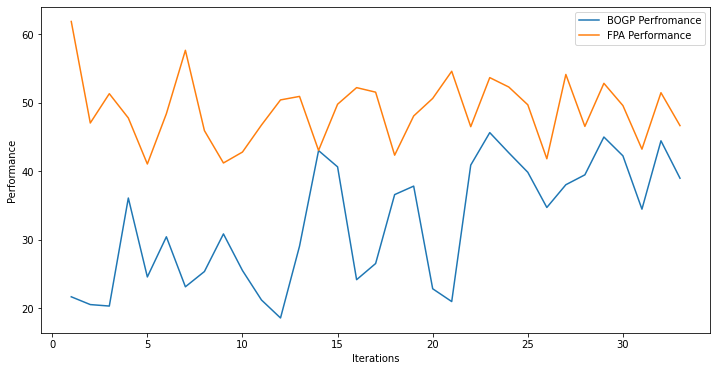

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.         -31.
  30.          30.         -31.          30.         -31.
  30.           0.68784145 -31.         -31.          30.        ]
f()=40.329613, actual=44.227
32


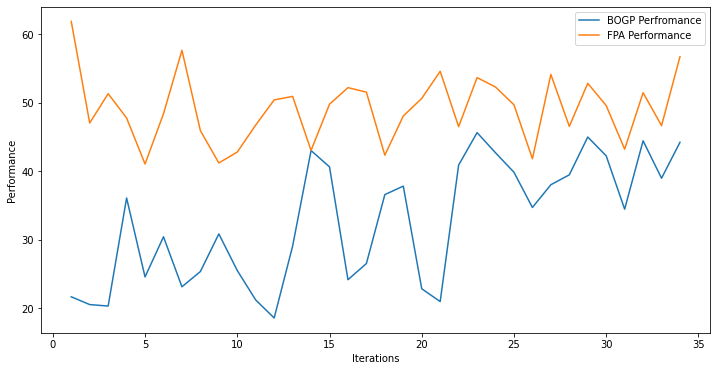

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.         -31.
  30.          30.         -31.          30.         -31.
  30.          14.97006686 -31.         -31.          30.        ]
f()=40.686450, actual=48.675
33


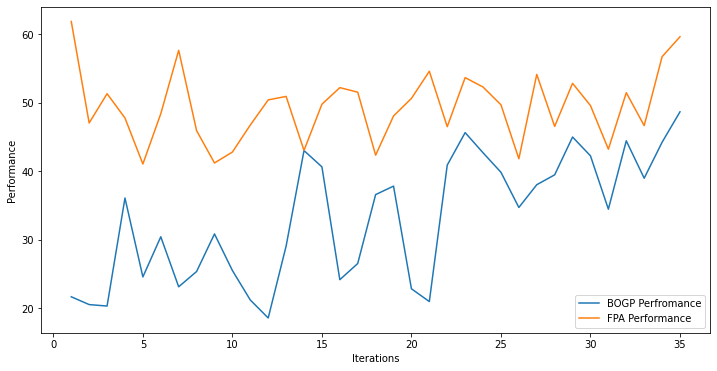

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=41.687948, actual=45.323
34


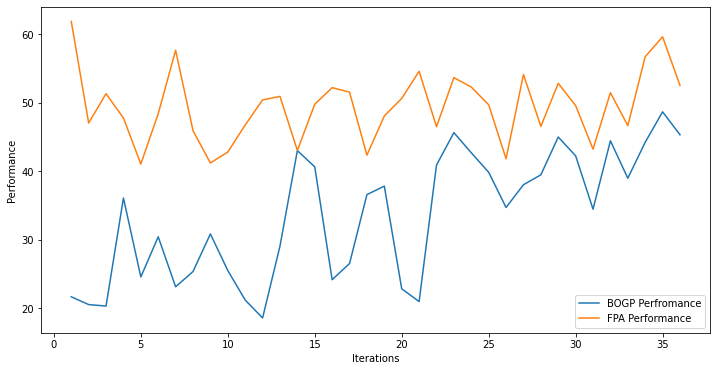

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=42.241216, actual=40.014
35


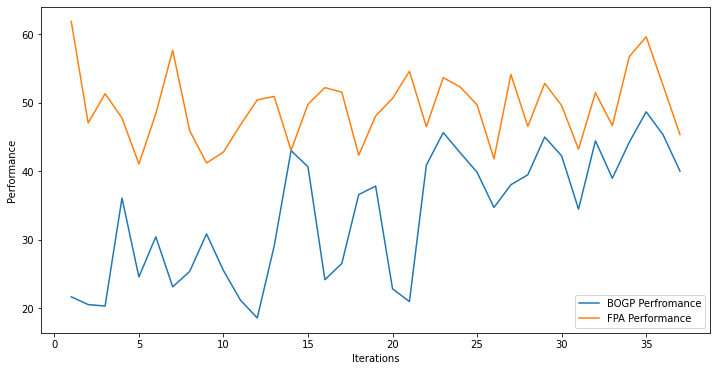

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=41.953876, actual=43.287
36


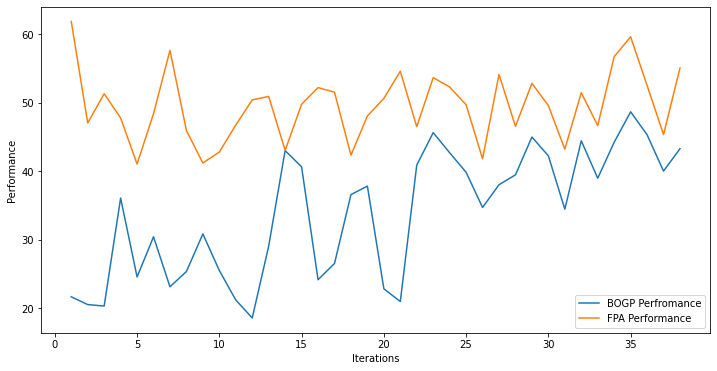

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=42.122040, actual=43.250
37


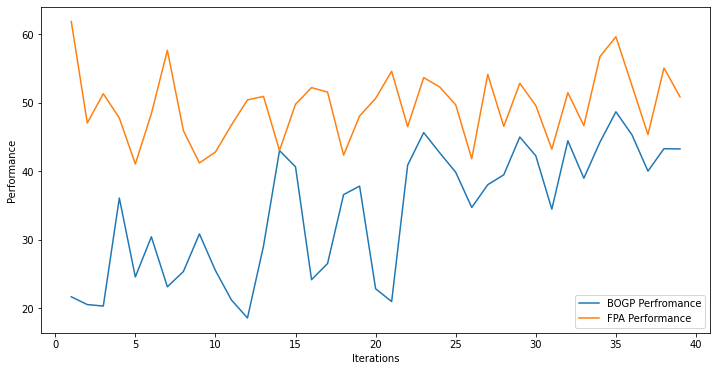

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=42.253001, actual=36.224
38


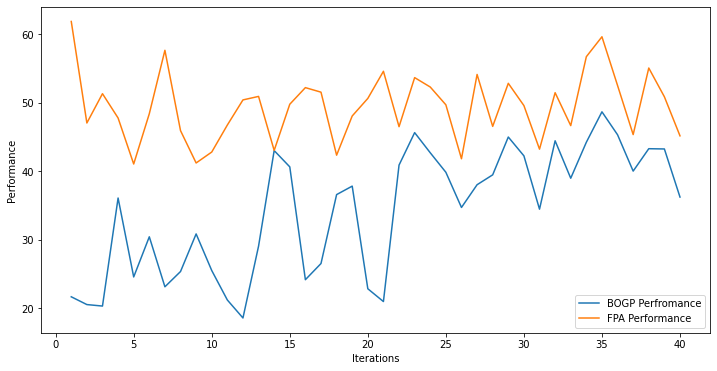

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=41.661469, actual=47.842
39


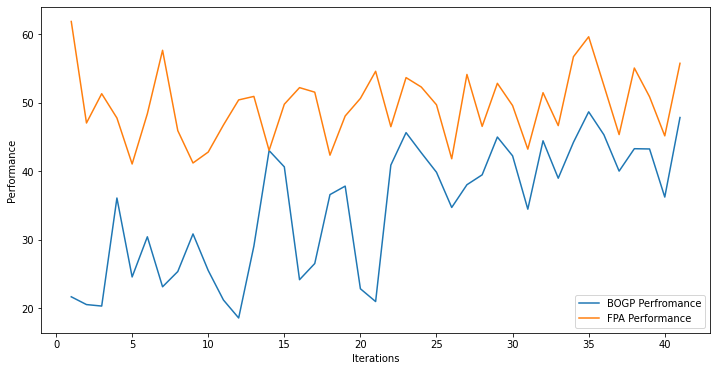

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=42.177746, actual=46.787
40


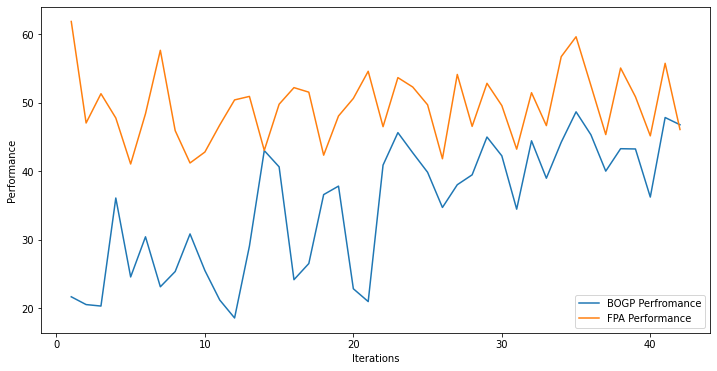

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=42.541576, actual=40.064
41


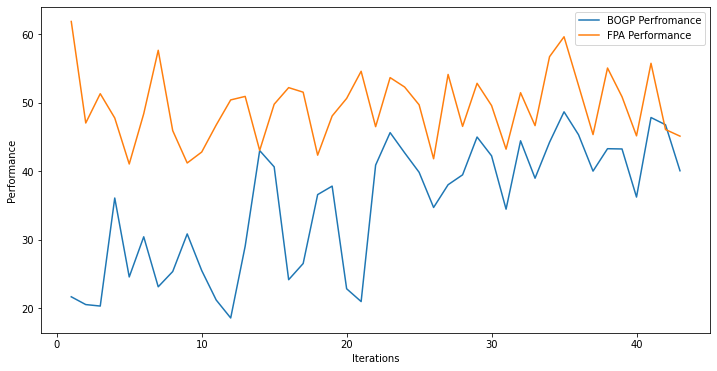

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=42.362547, actual=51.182
42


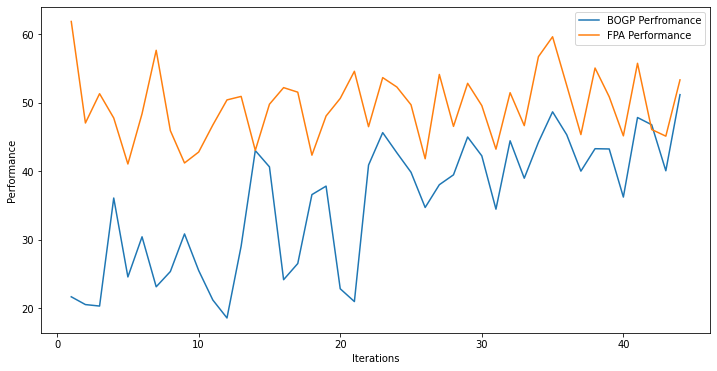

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=42.933531, actual=39.286
43


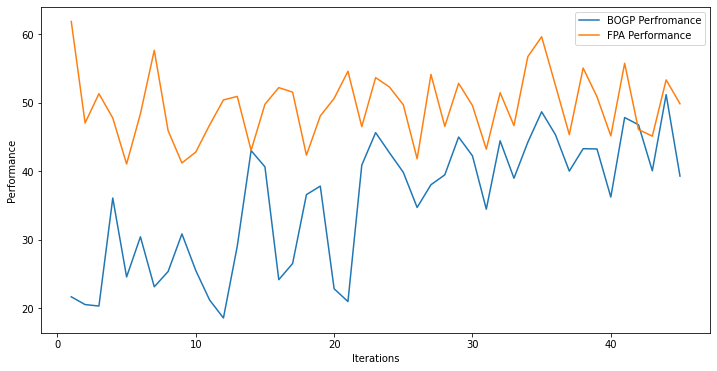

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=42.698564, actual=46.361
44


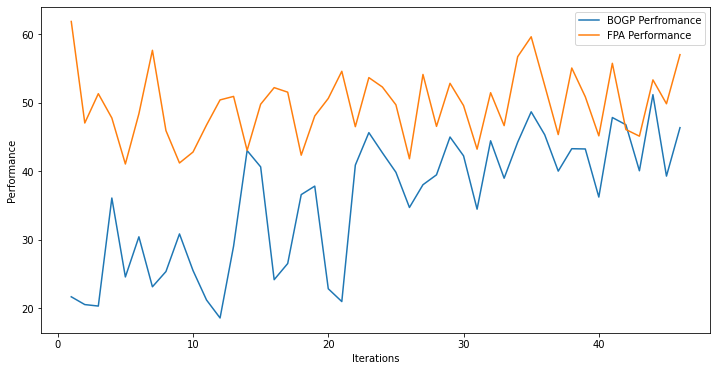

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=42.922241, actual=38.984
45


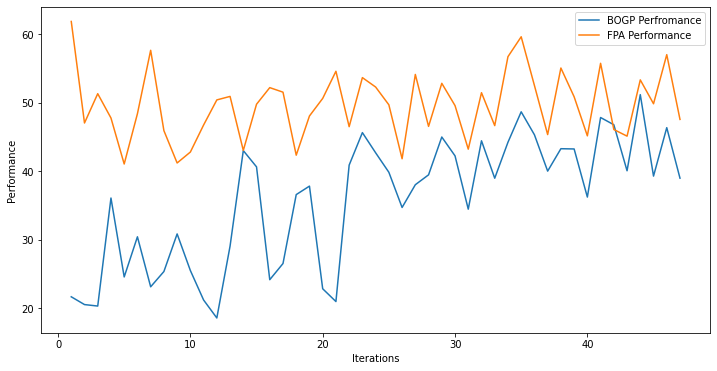

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=42.696390, actual=49.136
46


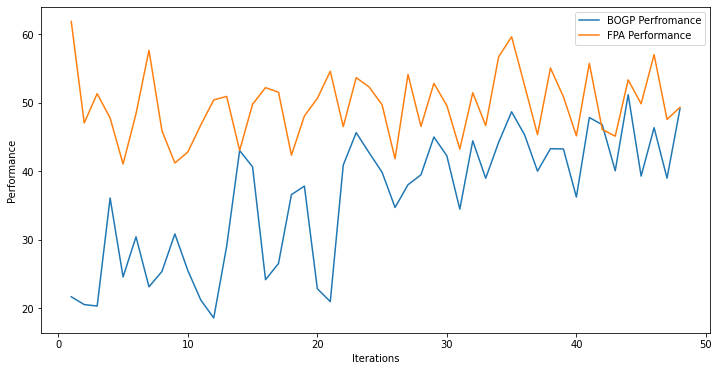

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=43.033365, actual=46.627
47


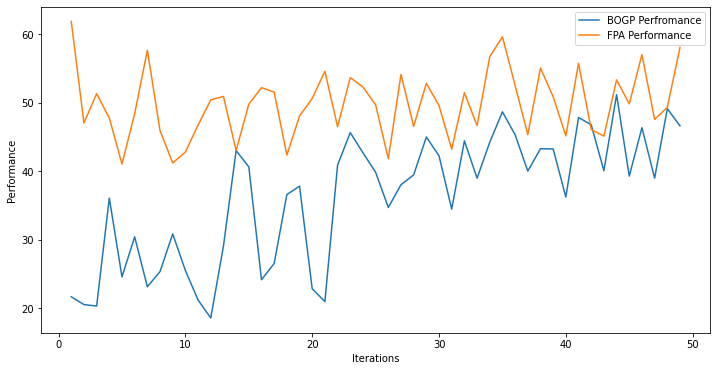

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=43.220399, actual=41.889
48


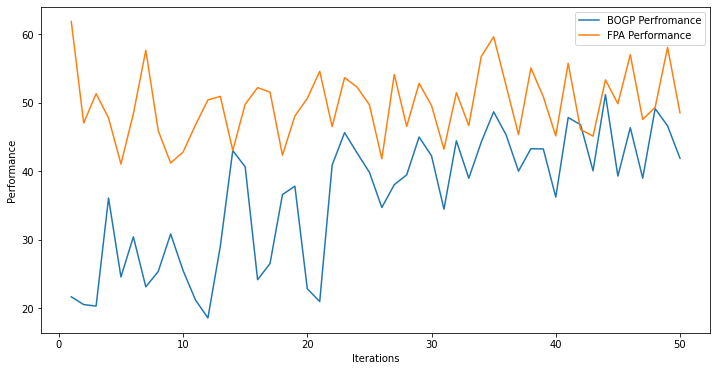

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=43.160843, actual=40.991
49


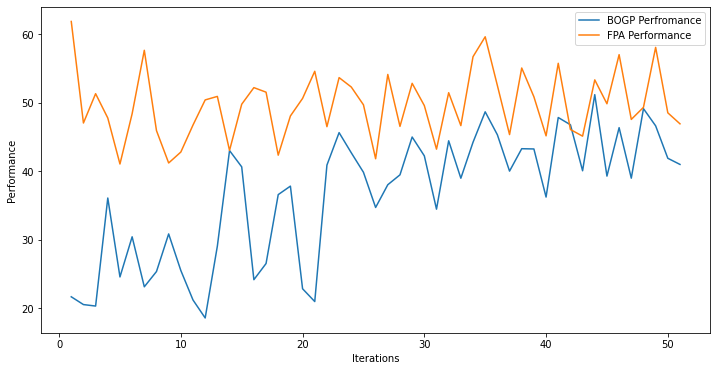

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=43.063305, actual=54.506
50


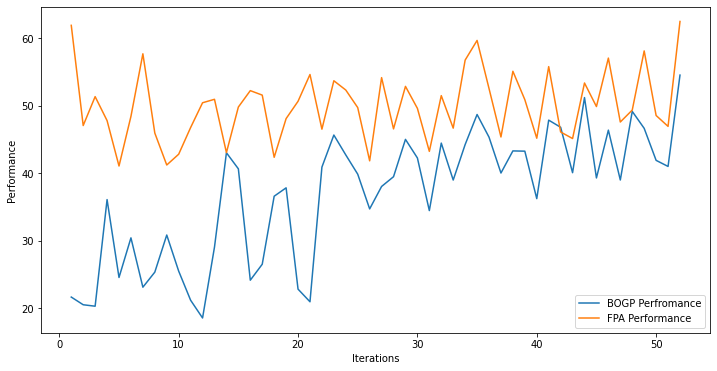

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=43.532102, actual=38.457
51


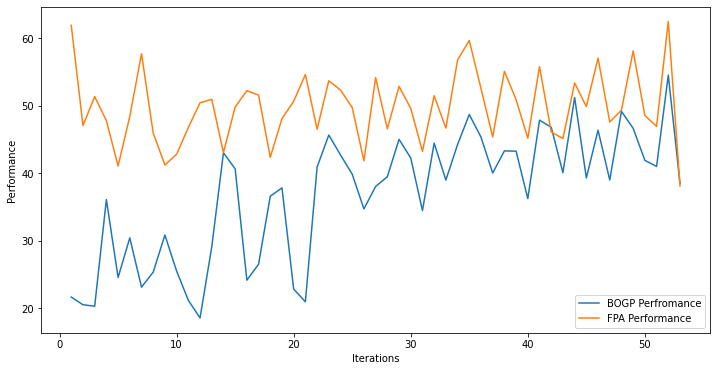

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=43.312133, actual=44.824
52


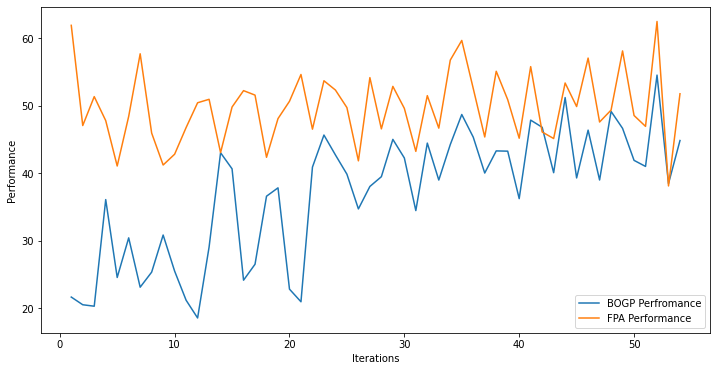

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=43.379032, actual=46.775
53


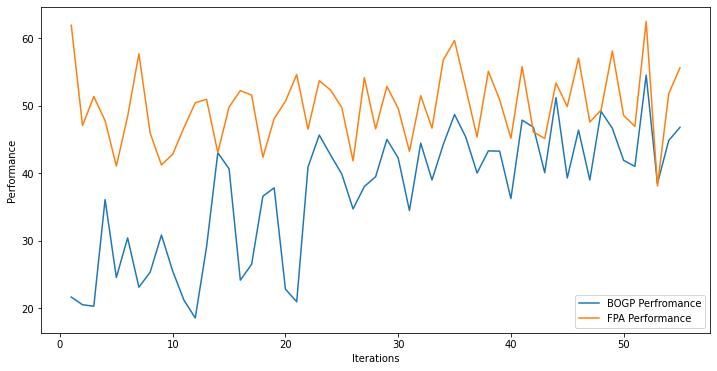

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=43.514896, actual=53.204
54


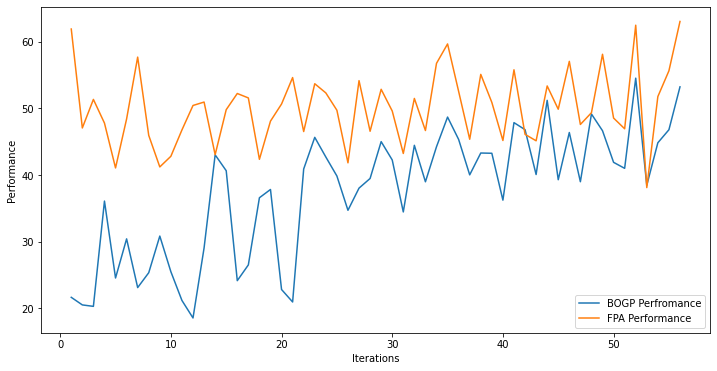

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=43.860363, actual=48.809
55


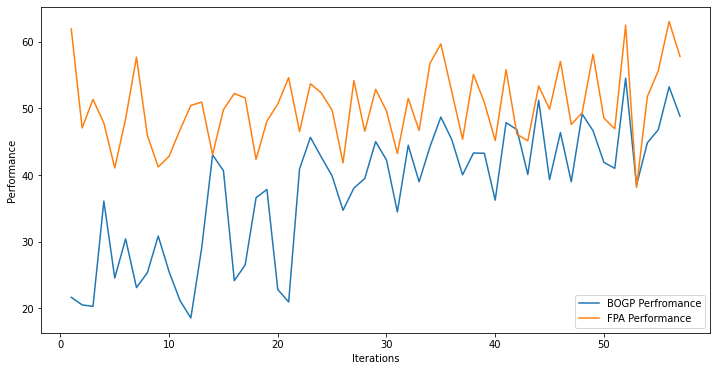

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=44.040693, actual=40.139
56


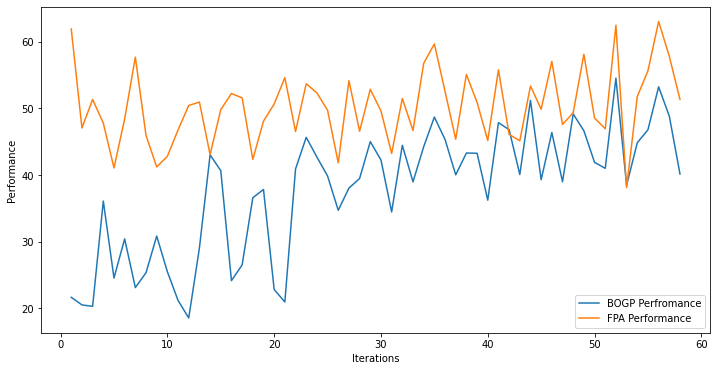

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=43.903206, actual=42.456
57


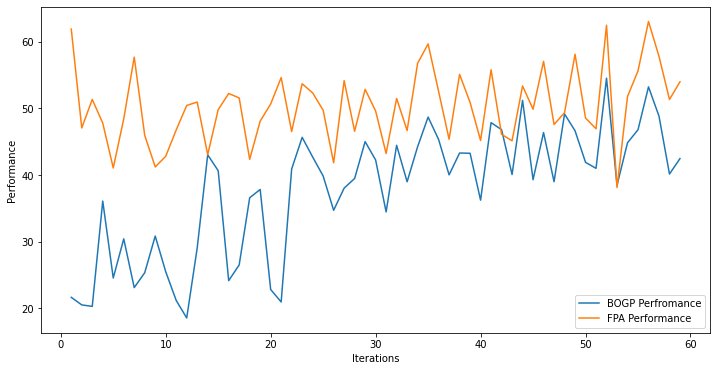

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=43.858065, actual=43.316
58


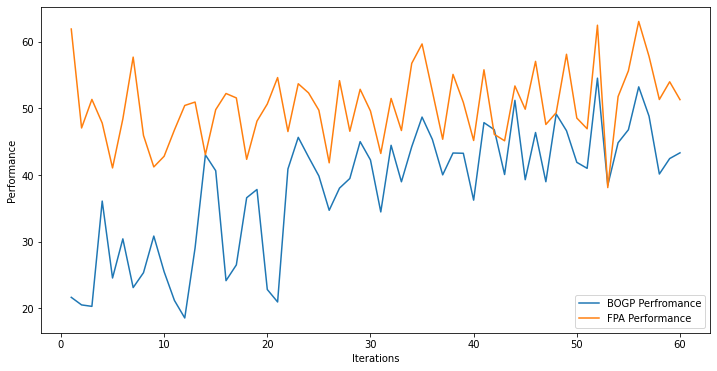

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=43.844671, actual=46.197
59


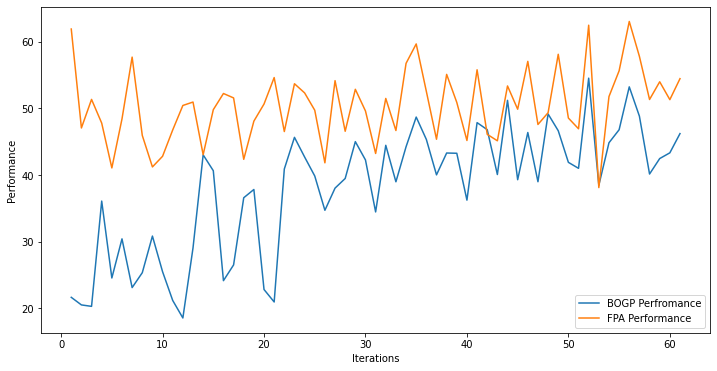

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=43.923194, actual=52.148
60


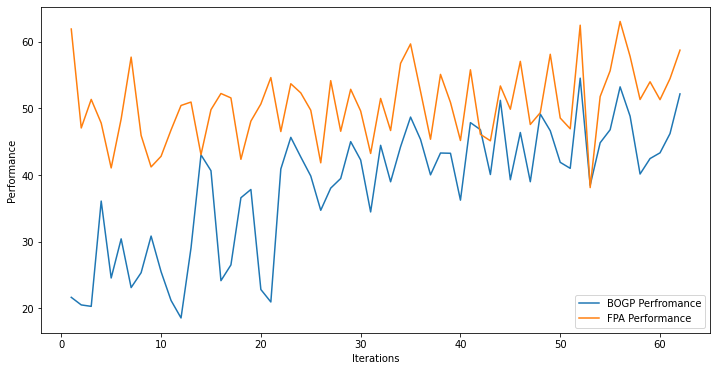

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=44.167498, actual=44.780
61


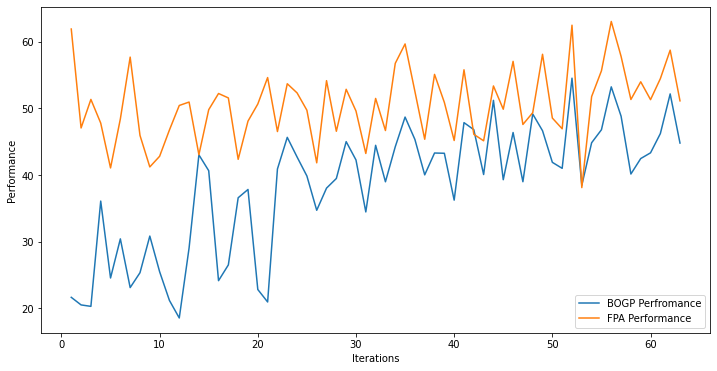

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=44.190216, actual=48.313
62


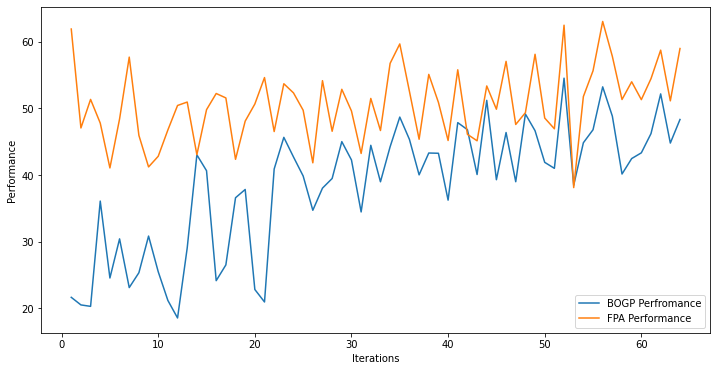

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=44.311724, actual=39.578
63


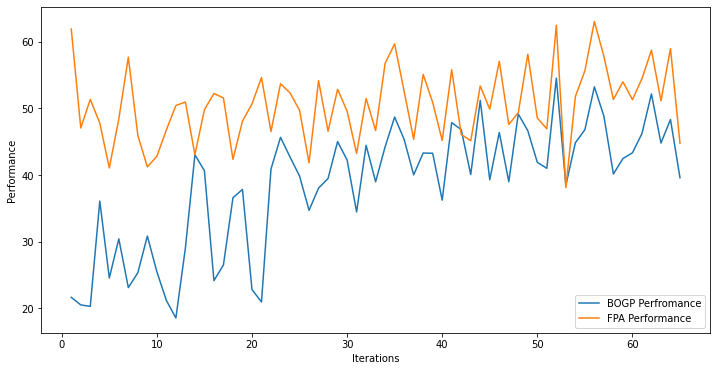

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=44.175651, actual=41.740
64


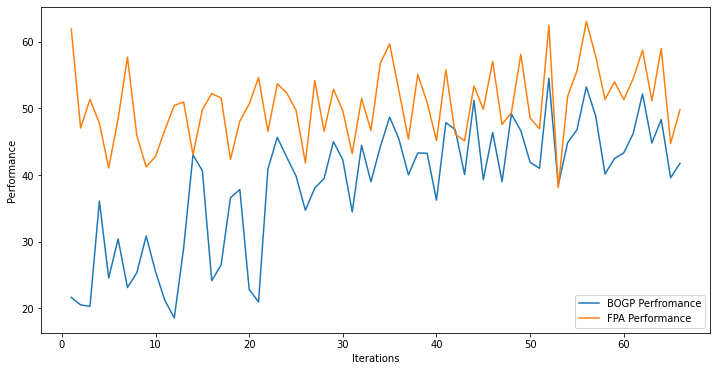

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=44.110597, actual=38.088
65


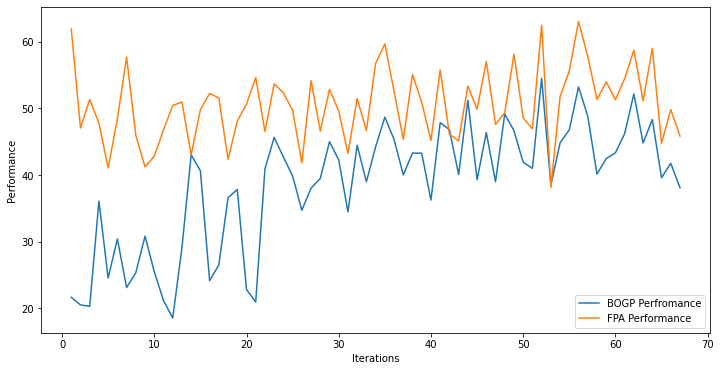

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=43.945023, actual=44.113
66


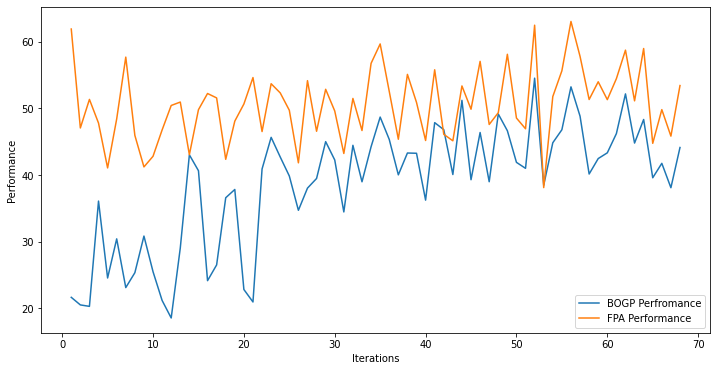

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=43.952687, actual=49.443
67


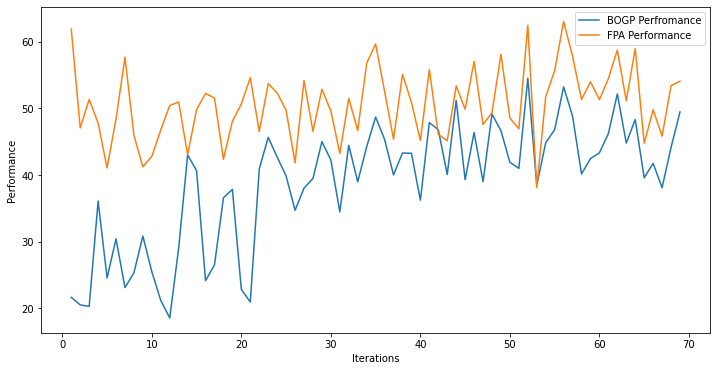

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=44.090881, actual=46.541
68


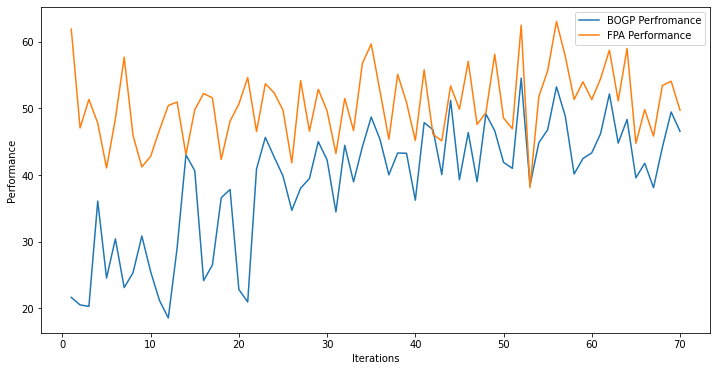

x_next is [ 29.49026367  25.89071743  29.21628689 -27.72570115  19.08548323
  28.8063492   20.71114912   0.26630916  18.75954739  27.43315626
 -27.77470427 -19.73973103  10.34960763  11.85646426 -23.13915077
 -15.00872003 -16.27316232   8.81820411  14.16707993  -7.09840921]
f()=38.820280, actual=36.273
69


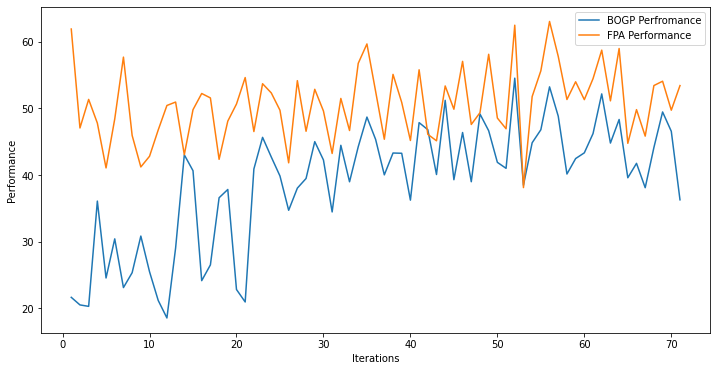

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.           0.26984467
  30.          30.         -30.03735726  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=44.293821, actual=46.500
70


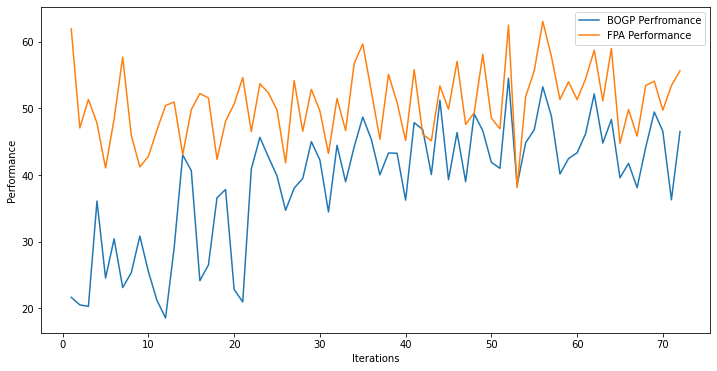

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -29.12317614  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=44.703234, actual=52.759
71


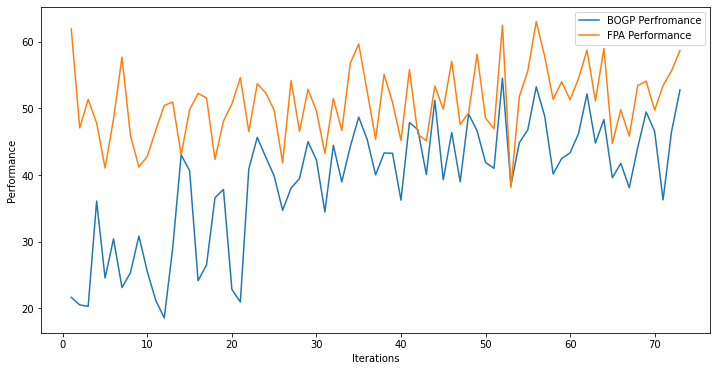

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -27.40953717  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=47.227064, actual=43.293
72


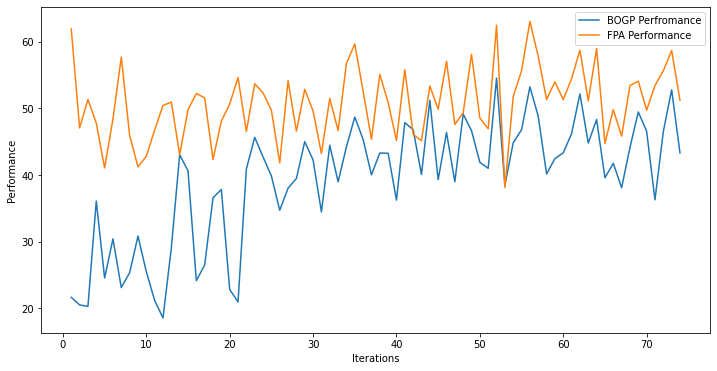

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=46.216064, actual=46.107
73


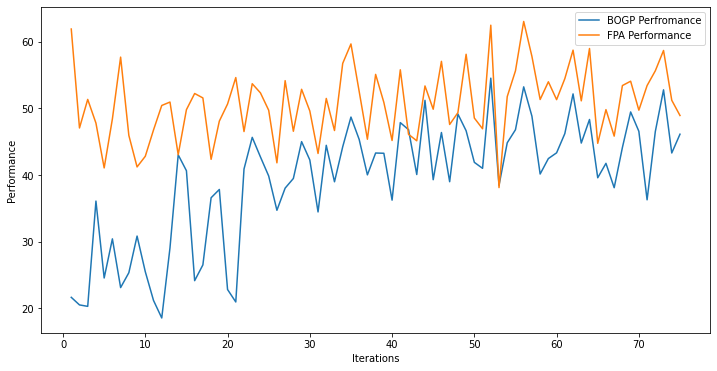

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=46.202107, actual=41.812
74


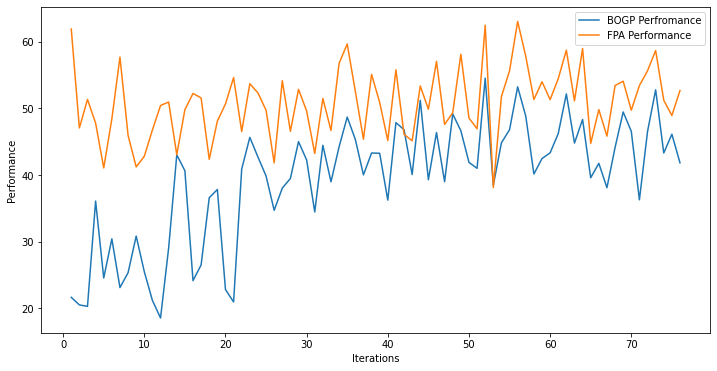

x_next is [ 30.        30.        30.        30.        30.        30.
  30.        30.        30.        30.        30.        30.
 -29.928823  30.       -31.        30.        30.       -31.
 -31.        30.      ]
f()=45.489608, actual=49.880
75


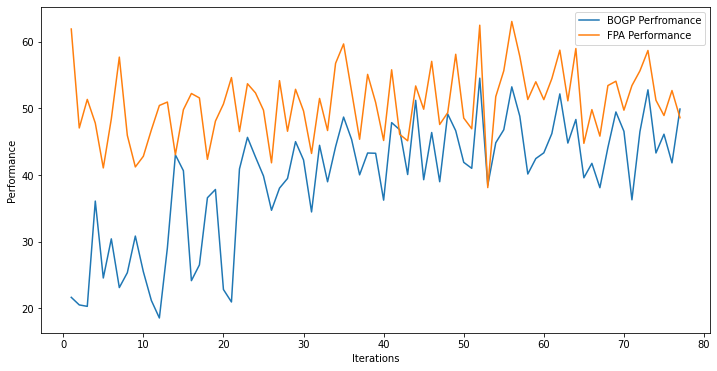

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -29.89309335  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=46.096205, actual=38.994
76


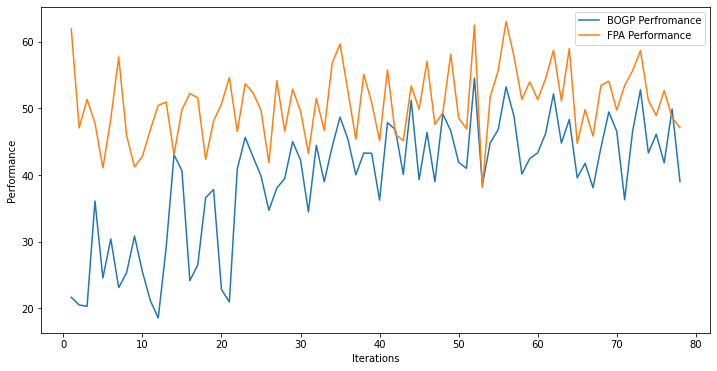

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=45.223380, actual=40.453
77


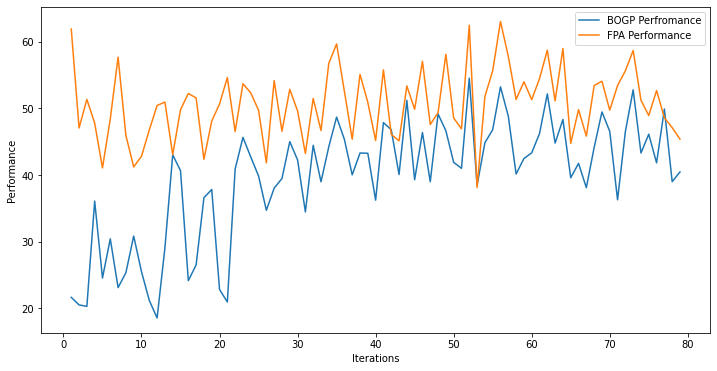

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -29.14330983  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=44.717111, actual=49.782
78


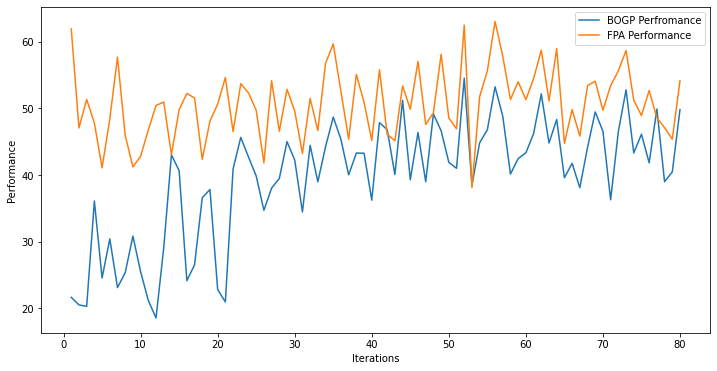

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -27.39624756  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=45.199673, actual=52.954
79


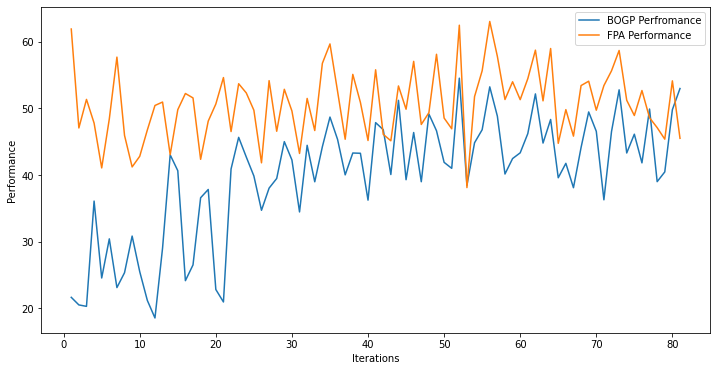

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -19.64607056  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=45.883935, actual=53.867
80


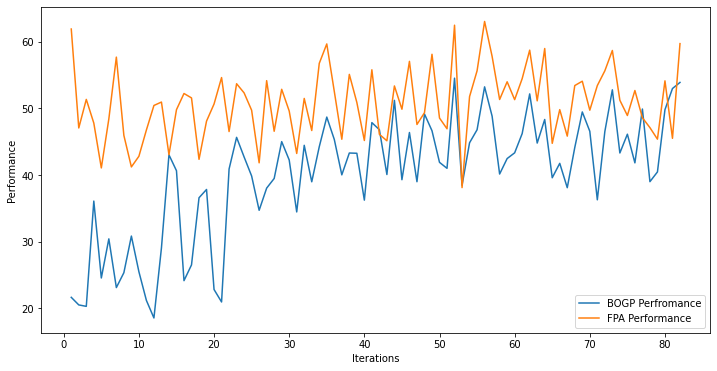

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.          16.06921712  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=46.789891, actual=53.674
81


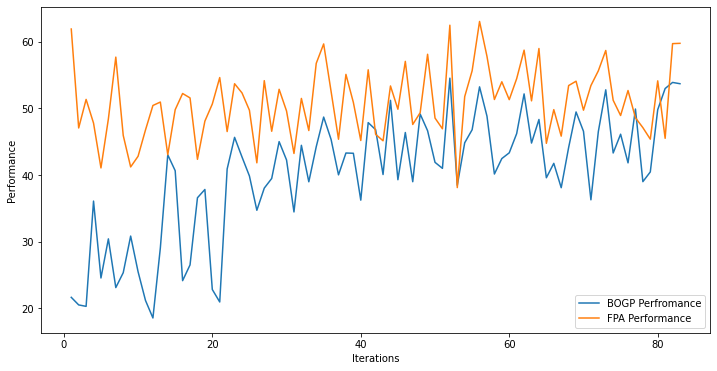

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.
 -31.  30.  30. -31. -31.  30.]
f()=49.142864, actual=41.987
82


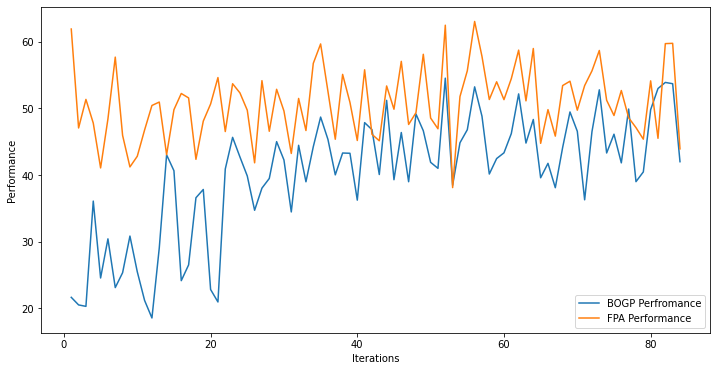

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.          15.58511135  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=46.949110, actual=48.361
83


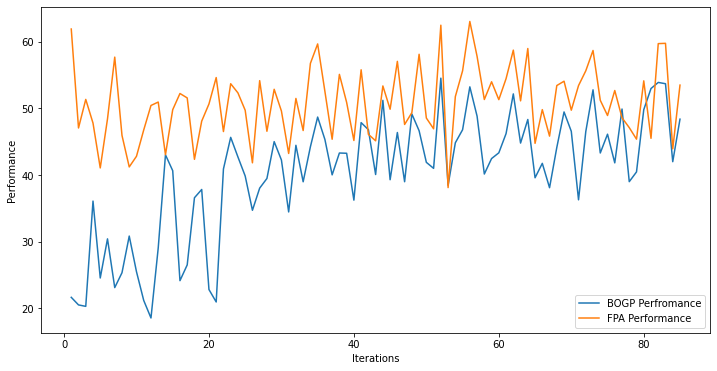

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.          28.58179357  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=47.199558, actual=42.528
84


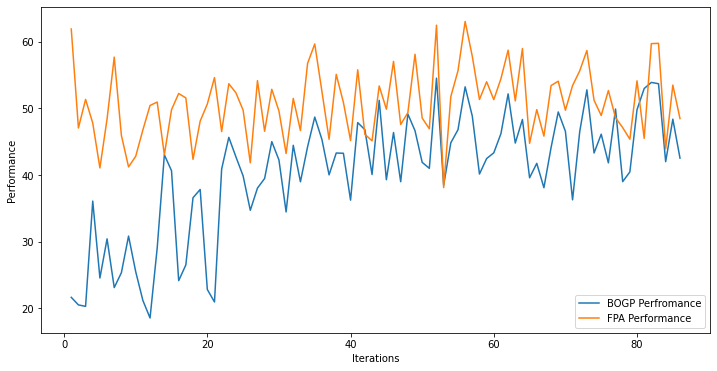

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -14.08549187  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=46.612489, actual=42.263
85


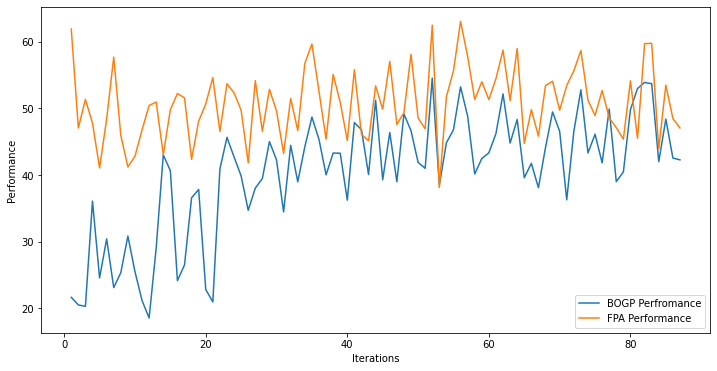

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -16.93885473  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=46.347655, actual=46.438
86


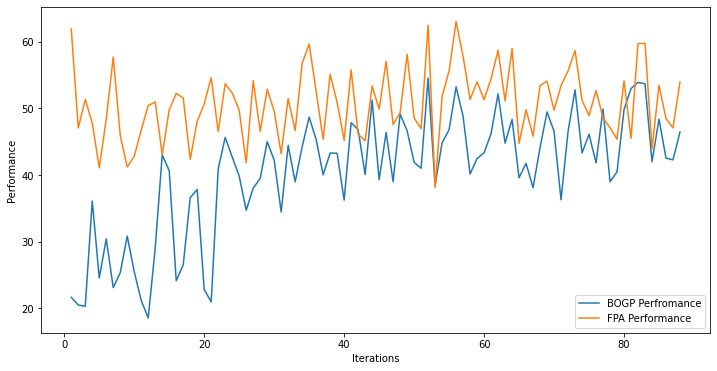

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -16.79592358  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=46.356964, actual=45.699
87


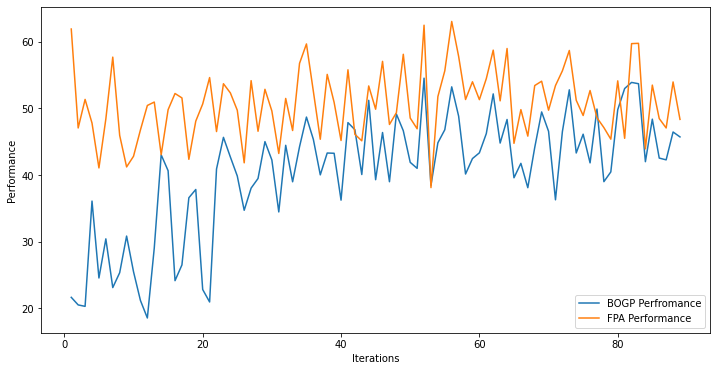

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -16.73848457  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=46.325406, actual=43.356
88


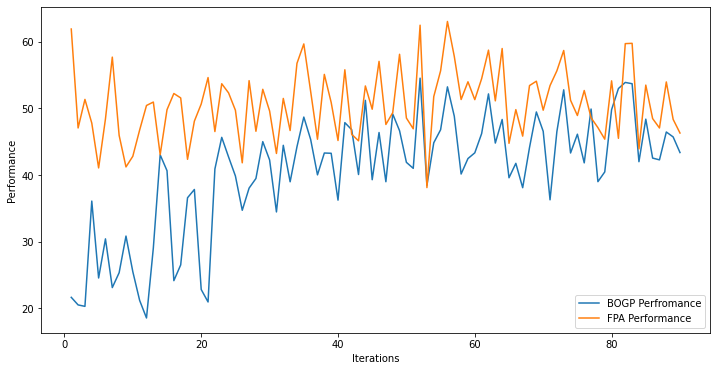

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -17.04359775  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=46.175981, actual=38.714
89


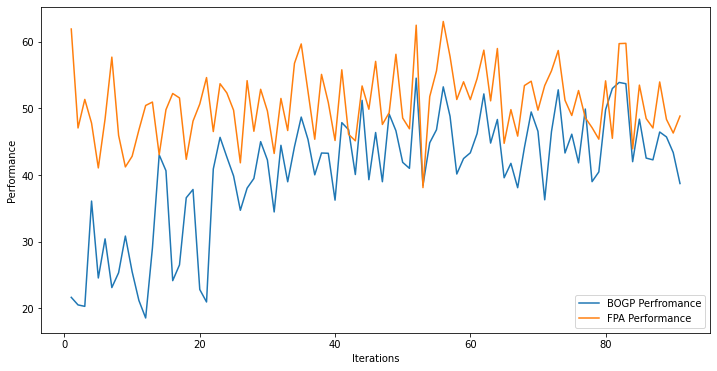

x_next is [ 29.99973038  29.99999998  29.99969285  29.99999965  29.99999999
  29.99992936  29.99999993  29.99998611  30.         -30.99980641
  29.99988514  29.99971857 -30.99992819  29.99986645 -30.9999379
  29.99999999  29.99999999 -30.99951028 -30.99978398  29.99999967]
f()=40.366419, actual=45.541
90


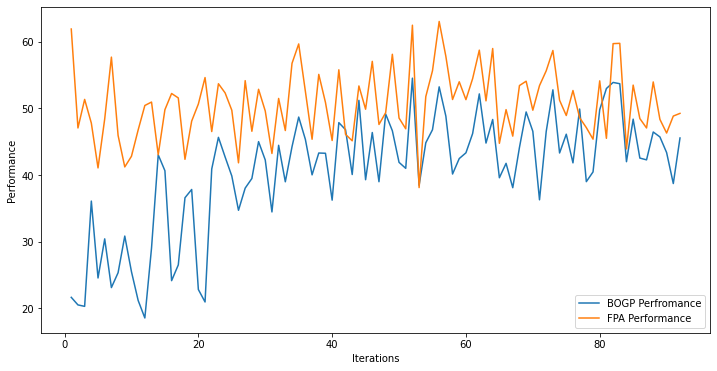

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -17.91101378  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=45.816917, actual=38.770
91


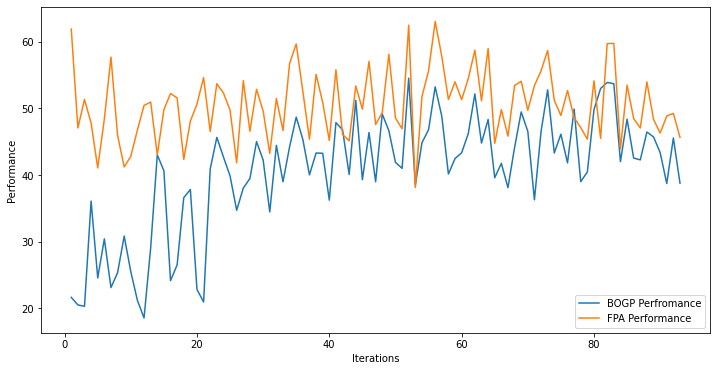

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -16.86748271  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=45.491888, actual=47.959
92


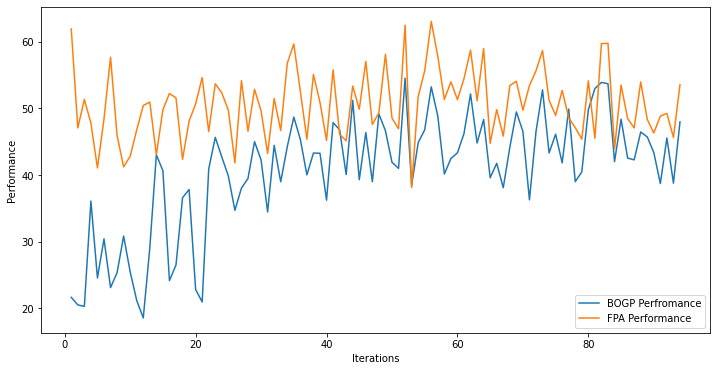

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -16.34597023  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=45.600790, actual=36.143
93


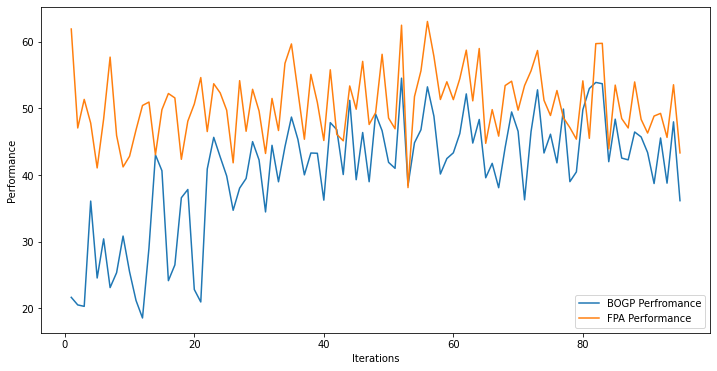

x_next is [ 30.          30.          30.          28.23447273  30.
  30.          30.          30.          30.           7.6702456
  25.25789847  30.         -12.38799737  30.         -31.
  30.          30.         -31.         -31.          29.23774933]
f()=45.719689, actual=45.927
94


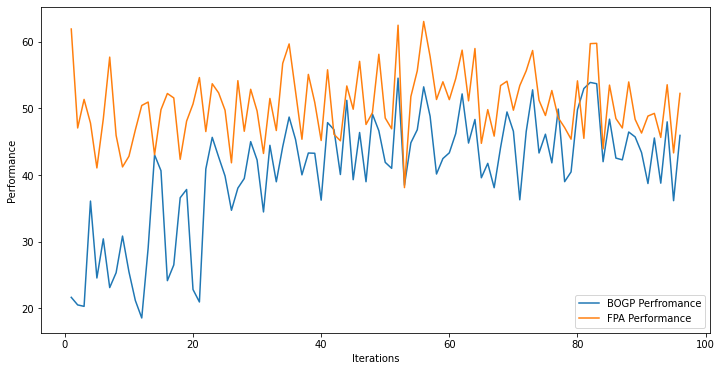

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -16.53171159  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=45.231711, actual=39.577
95


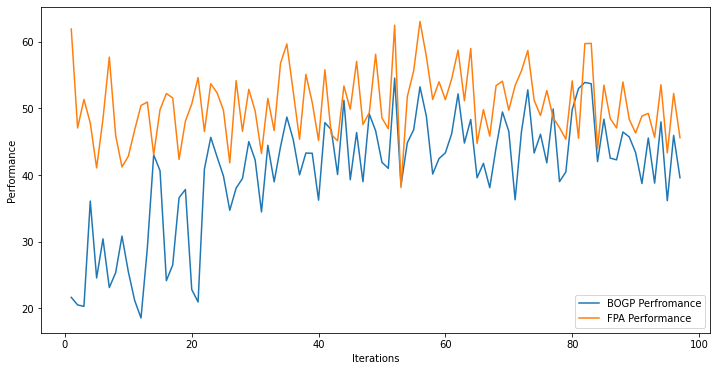

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -18.12704902  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=45.010324, actual=43.145
96


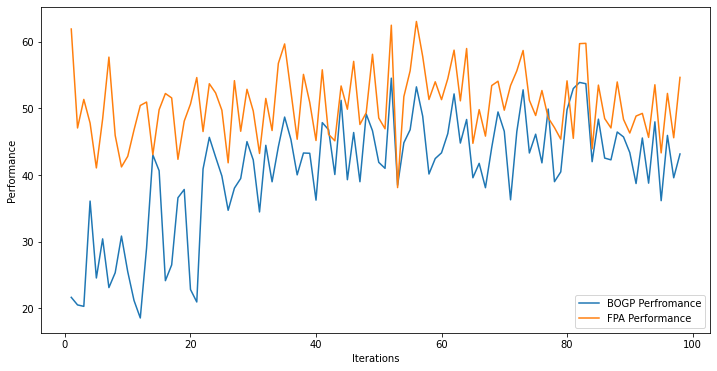

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -16.49315845  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=44.941783, actual=38.512
97


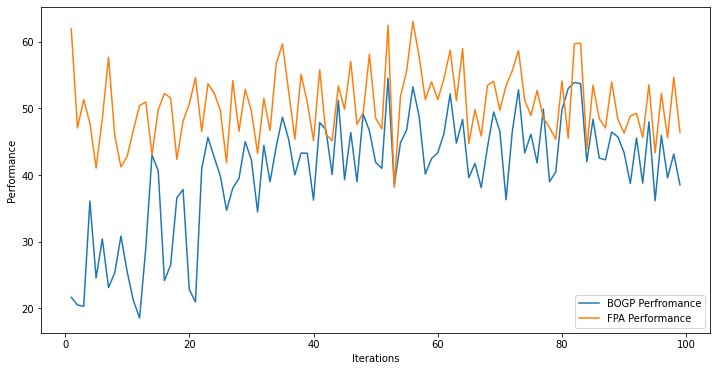

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -19.41320239  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=44.708825, actual=49.871
98


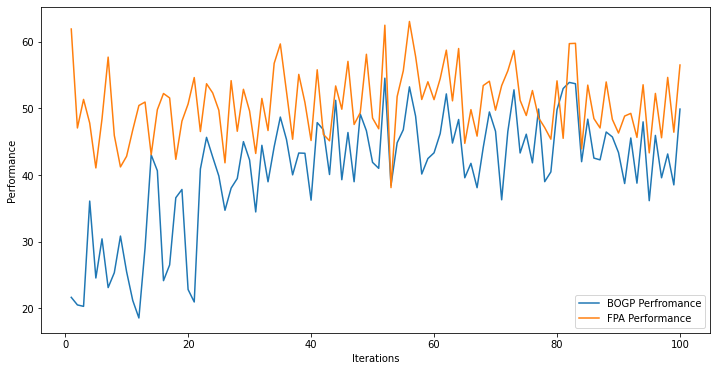

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -24.07754207  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=44.891335, actual=43.732
99


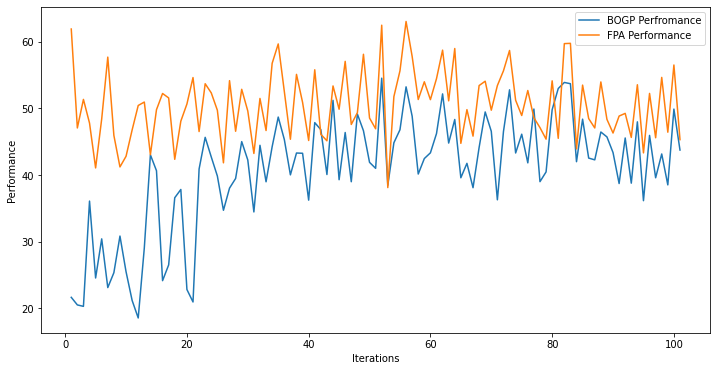

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -20.88279808  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=44.850917, actual=45.444
100


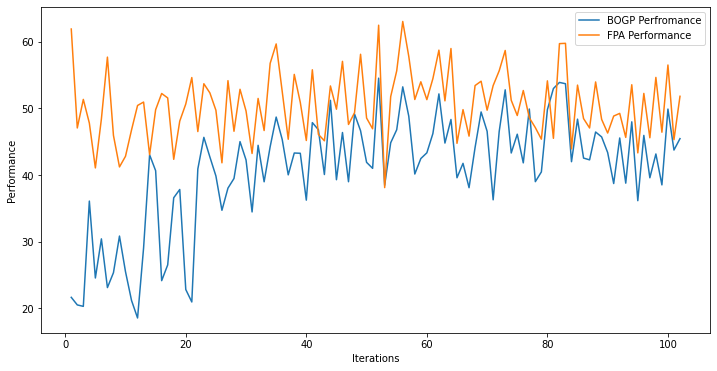

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -21.39822919  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=44.871799, actual=47.069
101


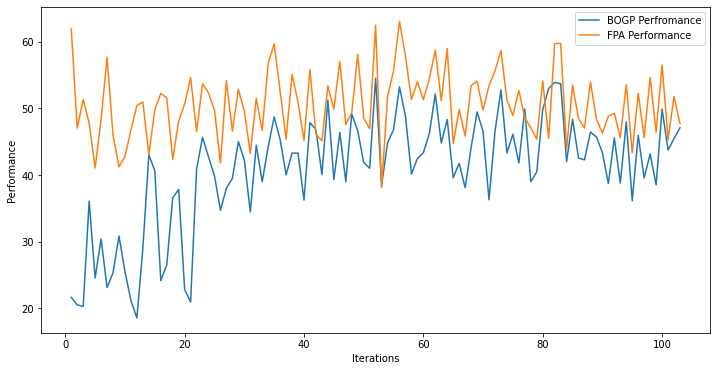

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -24.16316505  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=44.944605, actual=56.695
102


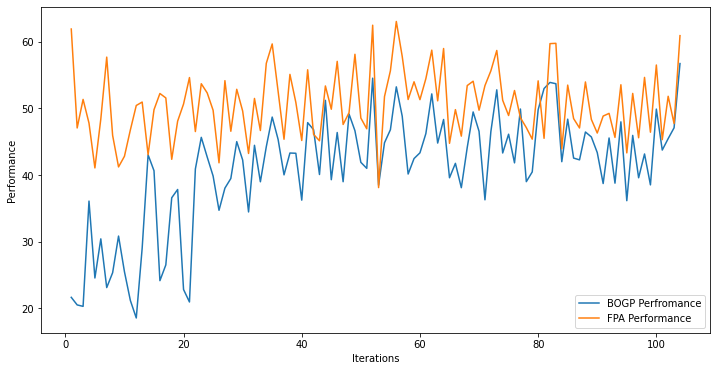

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=45.353577, actual=44.815
103


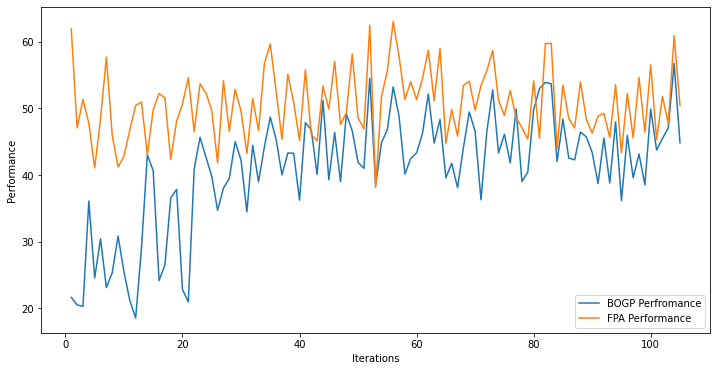

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=45.333295, actual=46.388
104


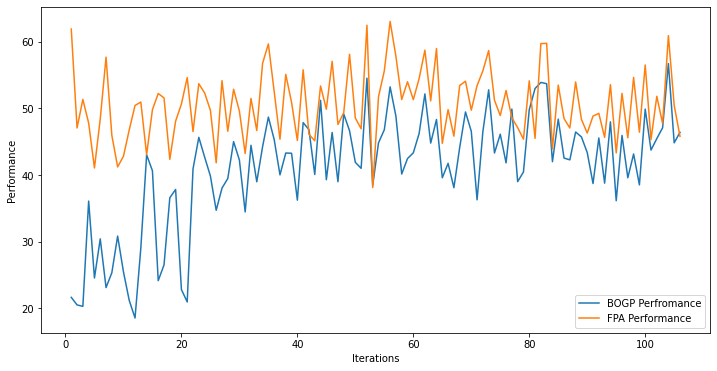

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=45.374676, actual=52.320
105


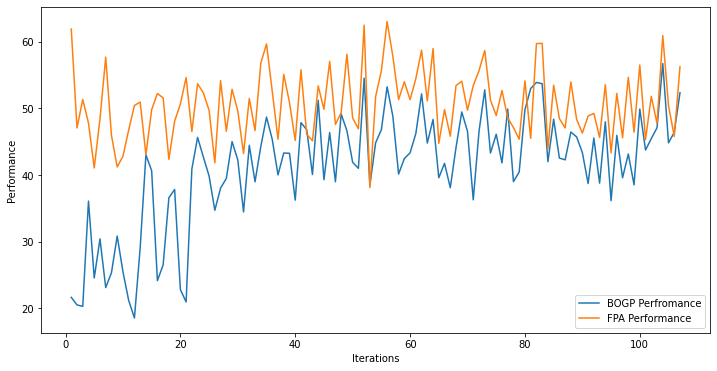

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=45.629300, actual=43.687
106


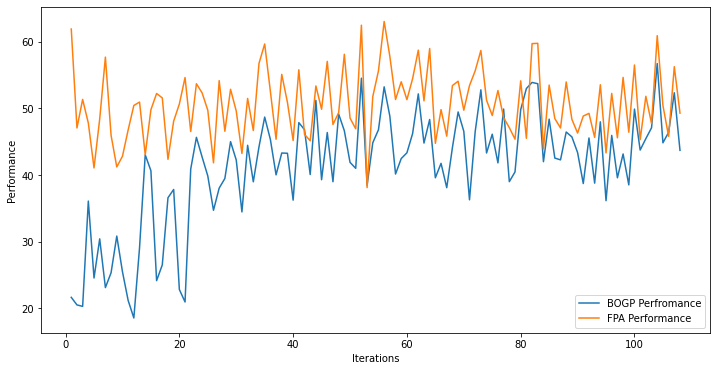

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=45.561137, actual=54.579
107


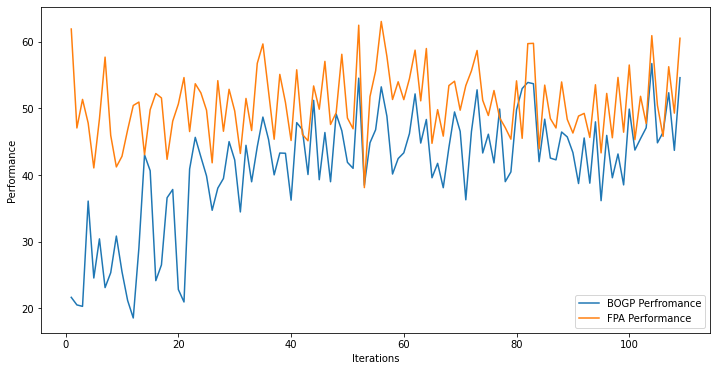

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=45.867570, actual=47.000
108


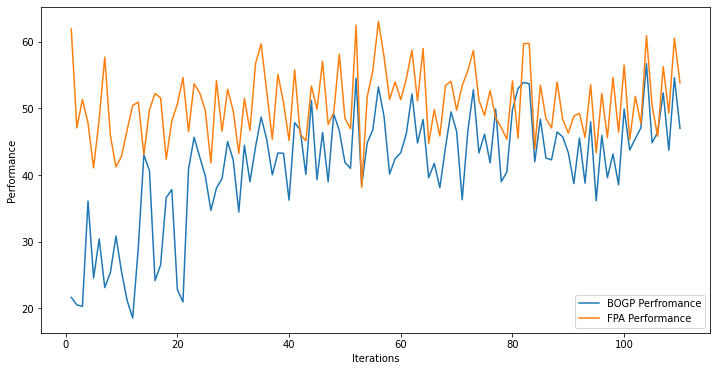

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=45.906964, actual=37.912
109


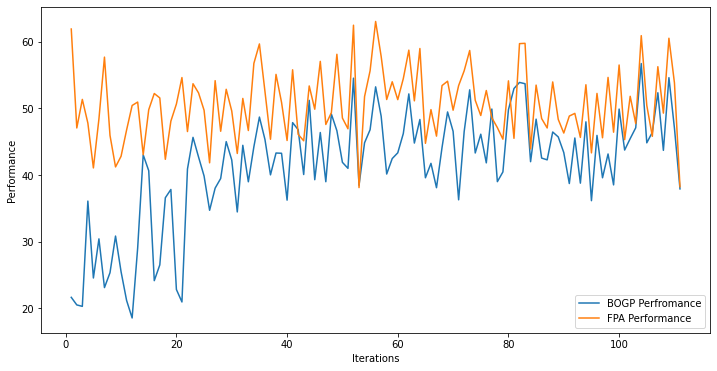

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=45.646138, actual=44.631
110


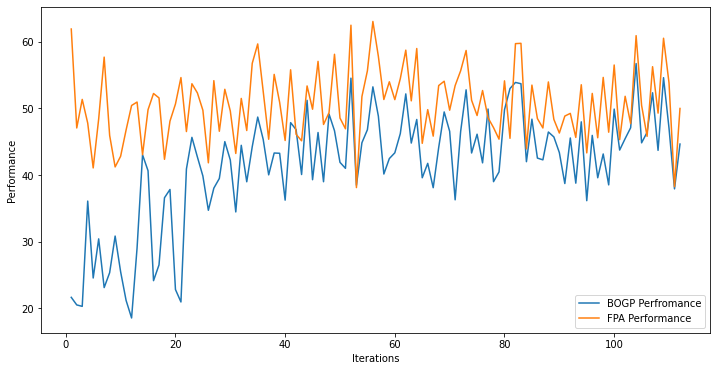

x_next is [ 29.9999972   29.99992116  29.99964726  29.9998528   29.99995778
  29.99990852  29.99997591  29.99998762  29.99978863  29.9999958
  29.99998923  29.9998337  -30.99997437  29.99971515 -30.99990099
  29.99957768  29.99990553 -30.99995055 -30.99991636  29.99976109]
f()=41.279052, actual=50.075
111


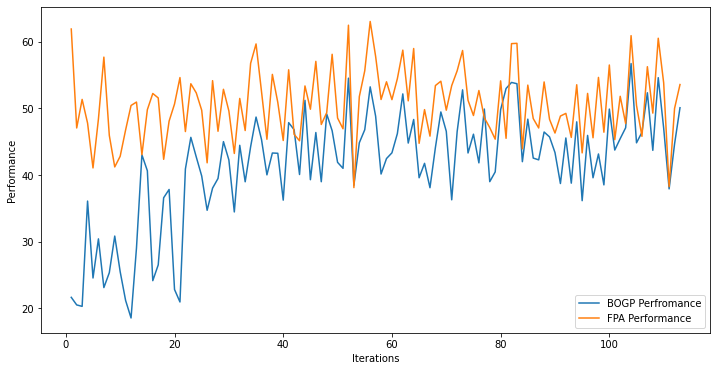

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=45.750487, actual=46.610
112


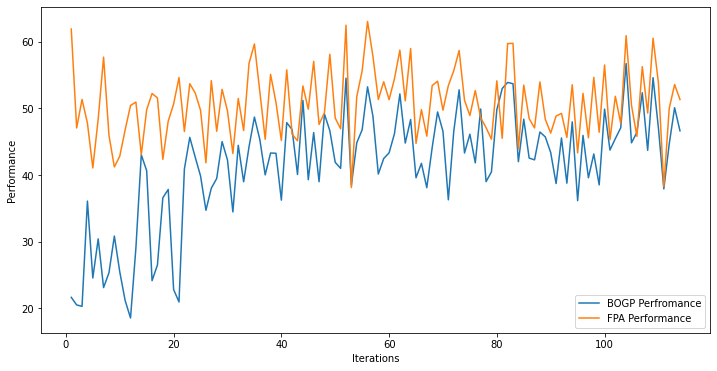

x_next is [ 29.99996872  29.99992648  29.99983419  29.99967624  29.9997832
  29.99948351  29.99951925  29.99998577  29.99970815  29.99842972
  29.99995093  29.99970922 -30.99994835  29.9999004  -30.99980461
  29.99951532  29.99936483 -30.99990228 -30.99960135  29.99992518]
f()=41.403096, actual=46.402
113


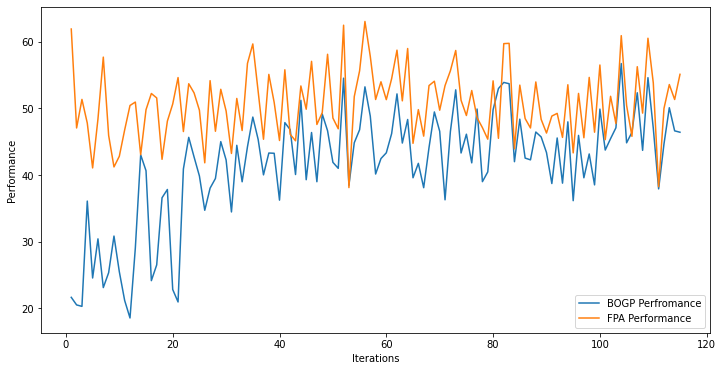

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=45.796075, actual=35.912
114


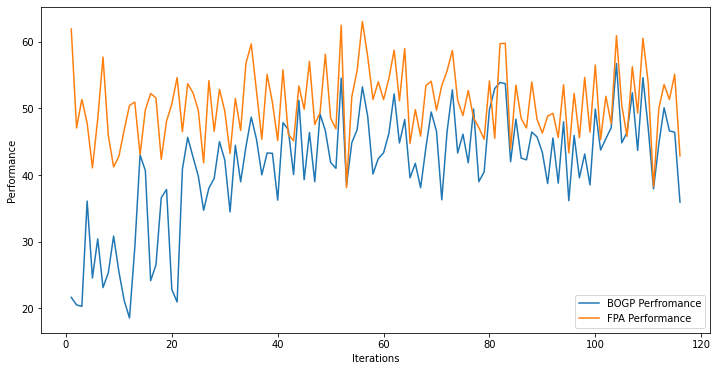

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=45.518308, actual=43.576
115


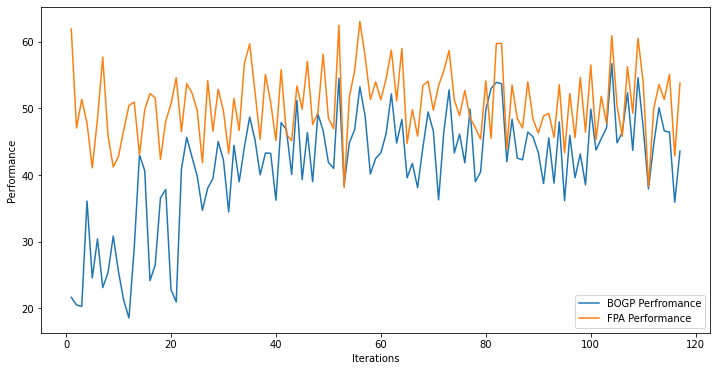

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=45.466918, actual=38.058
116


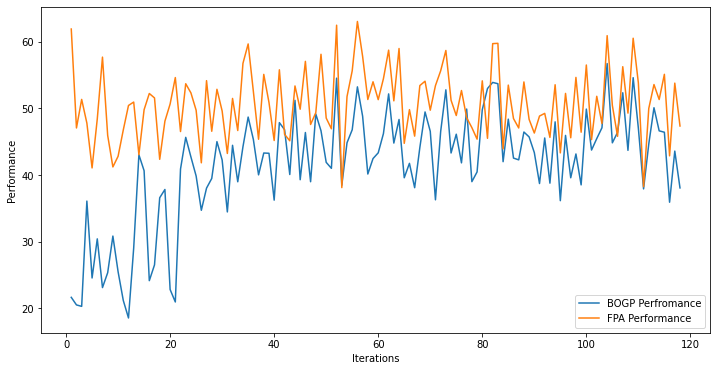

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=45.272531, actual=43.844
117


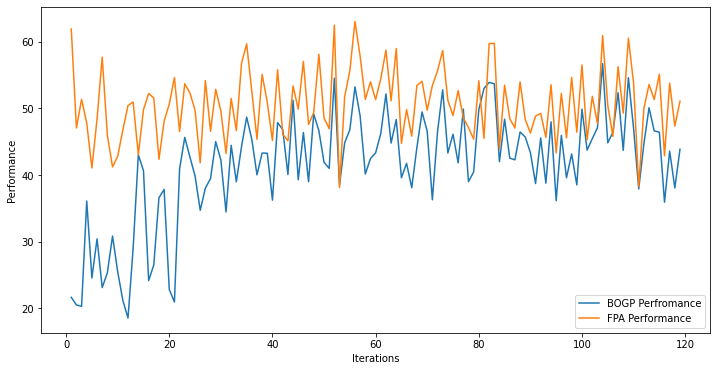

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=45.236844, actual=43.483
118


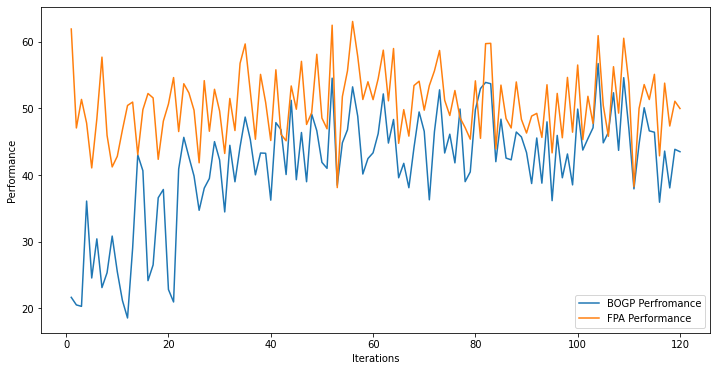

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=45.193890, actual=53.867
119


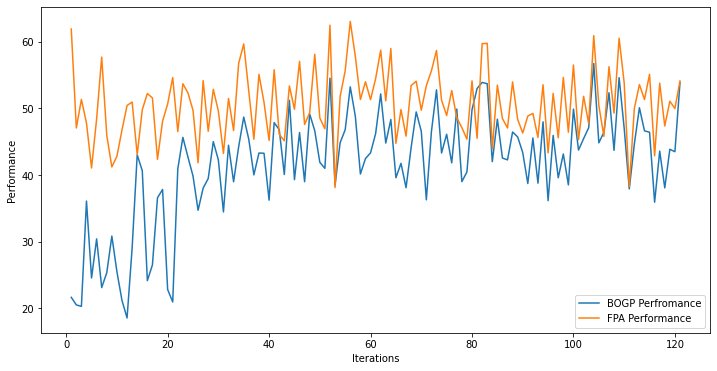

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=45.401849, actual=46.870
120


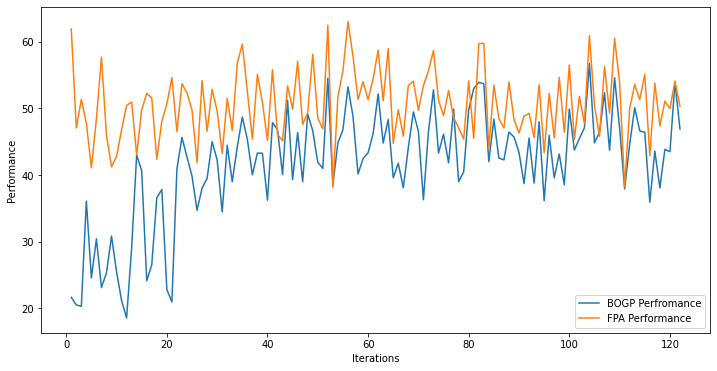

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=45.437127, actual=40.869
121


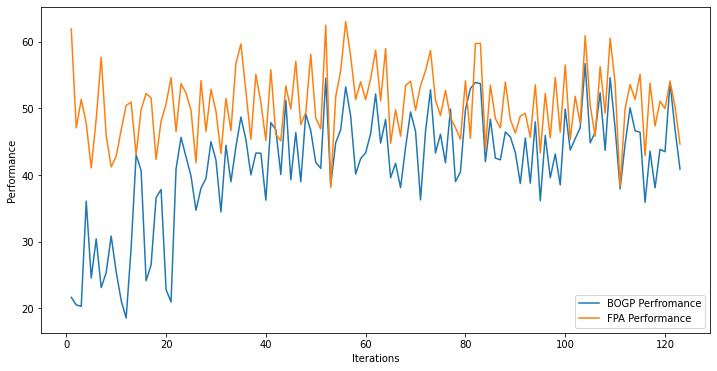

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=45.331820, actual=44.926
122


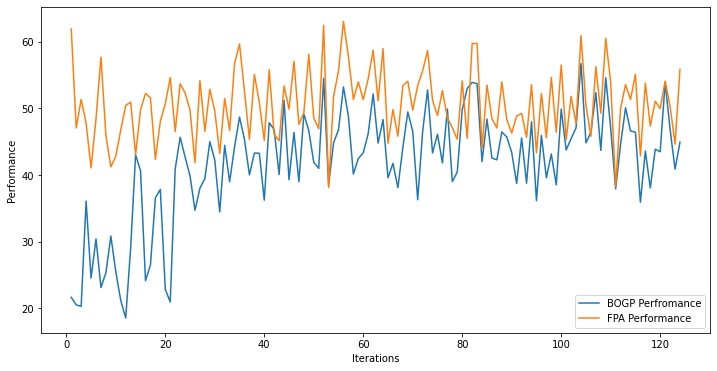

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=45.323265, actual=44.261
123


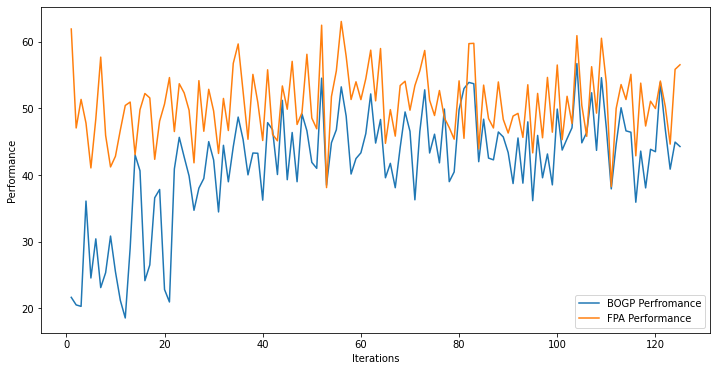

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=45.300369, actual=53.348
124


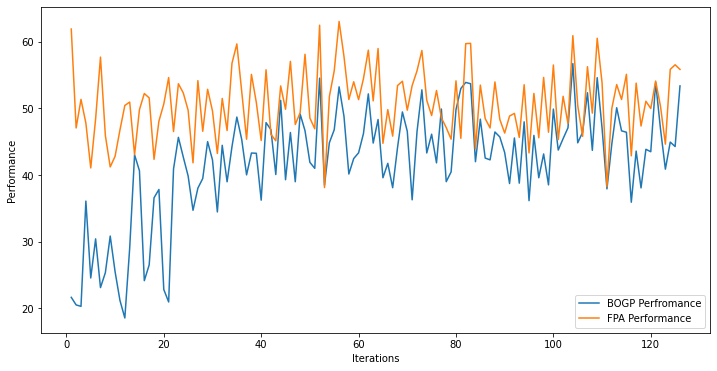

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=45.472804, actual=42.880
125


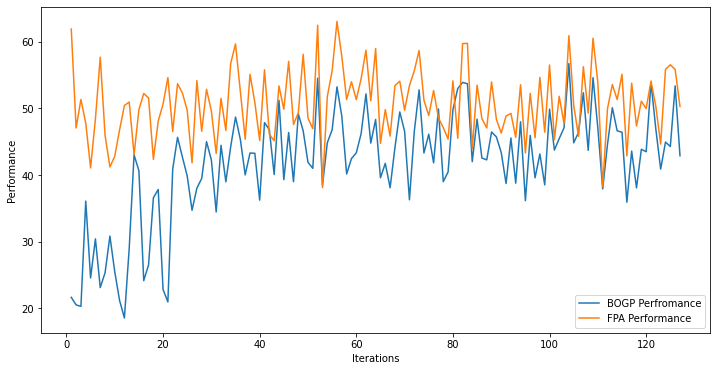

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=45.418464, actual=49.534
126


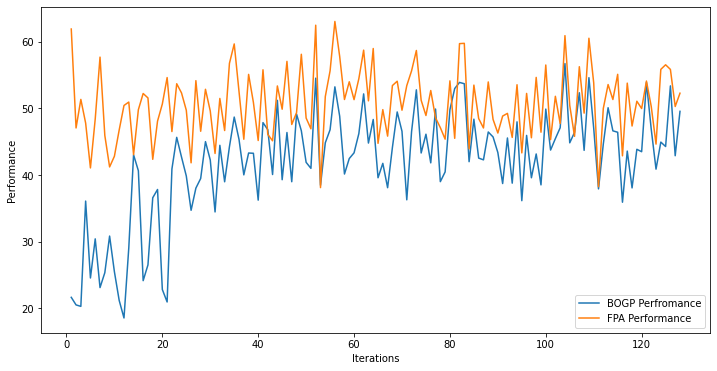

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=45.503763, actual=52.403
127


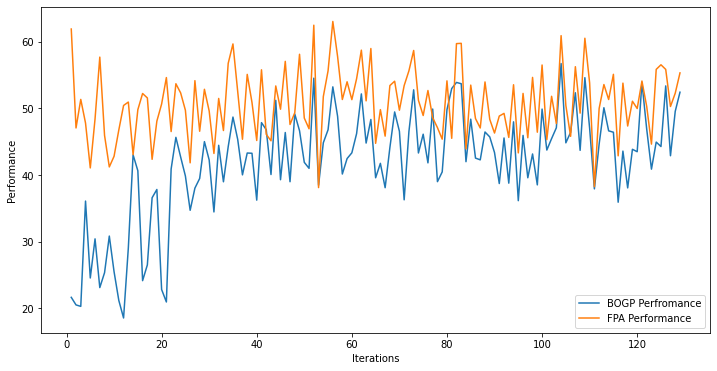

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=45.642951, actual=33.809
128


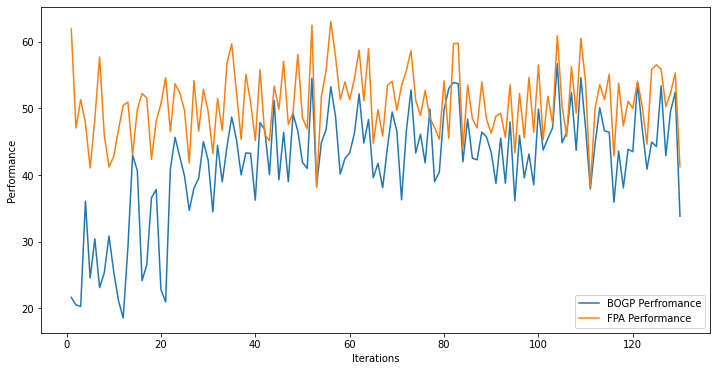

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=45.404707, actual=47.084
129


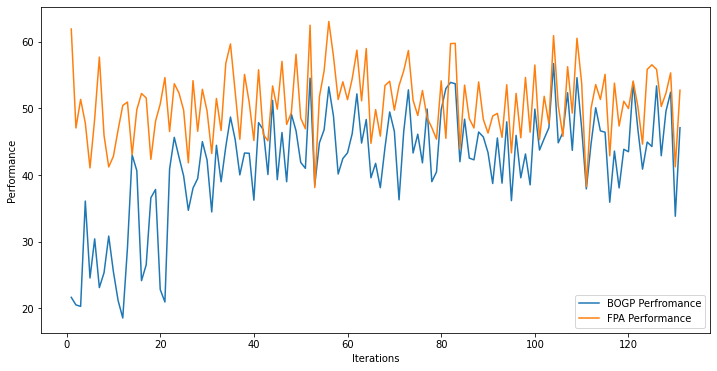

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=45.437776, actual=53.426
130


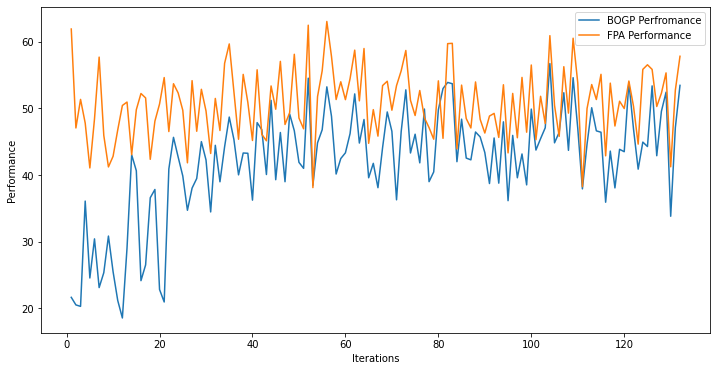

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=45.588759, actual=39.487
131


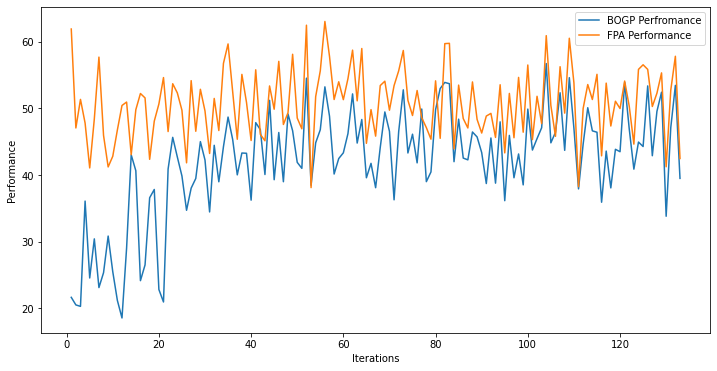

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=45.474406, actual=53.364
132


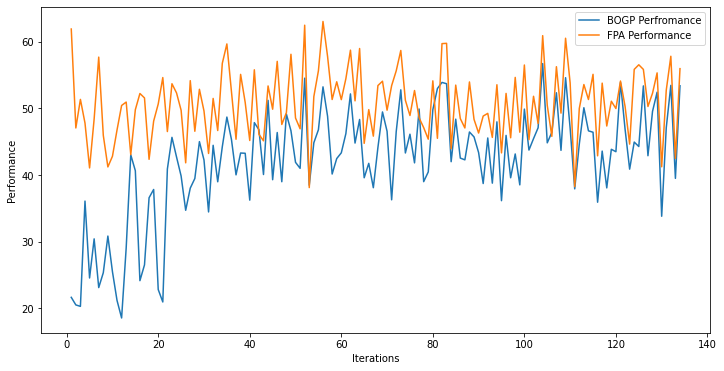

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=45.617905, actual=41.901
133


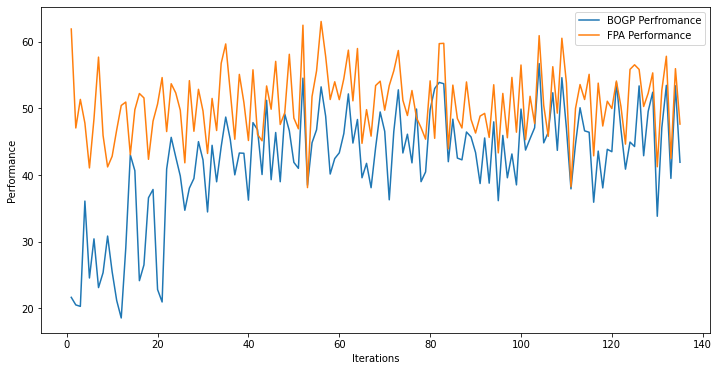

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=45.551259, actual=50.239
134


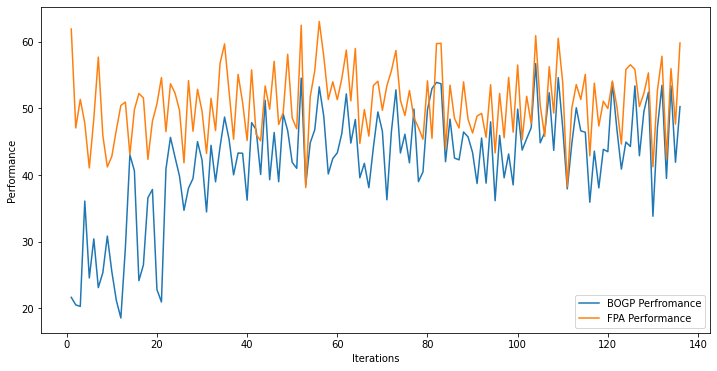

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=45.634161, actual=53.975
135


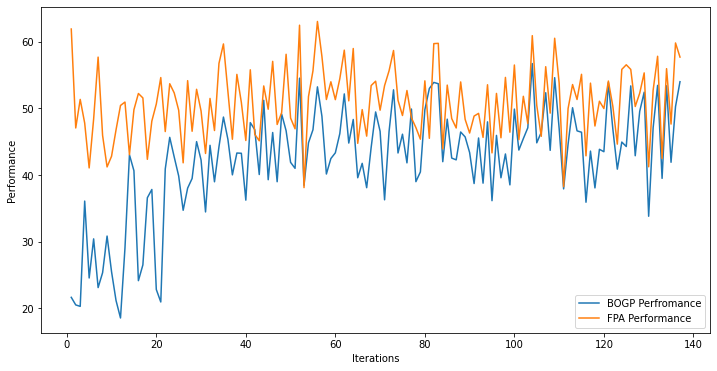

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=45.777844, actual=41.819
136


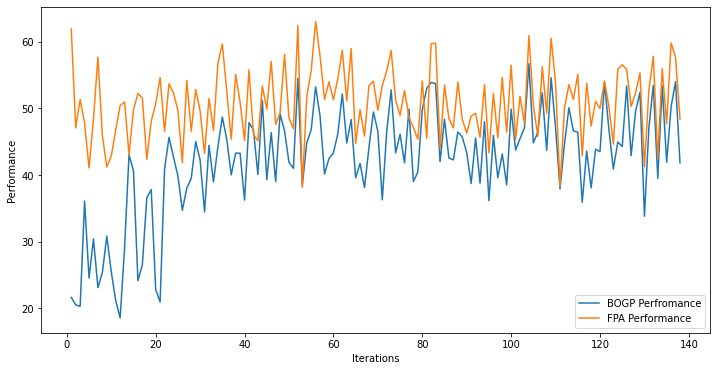

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=45.710404, actual=40.787
137


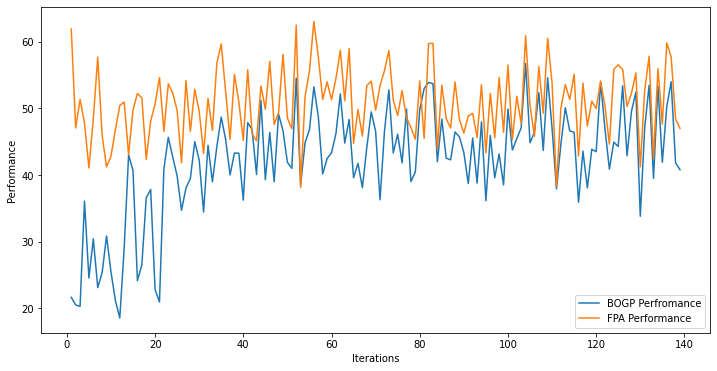

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=45.627711, actual=40.750
138


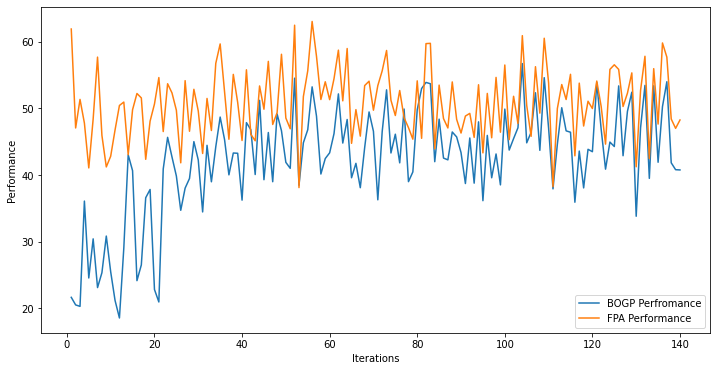

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=45.547227, actual=36.164
139


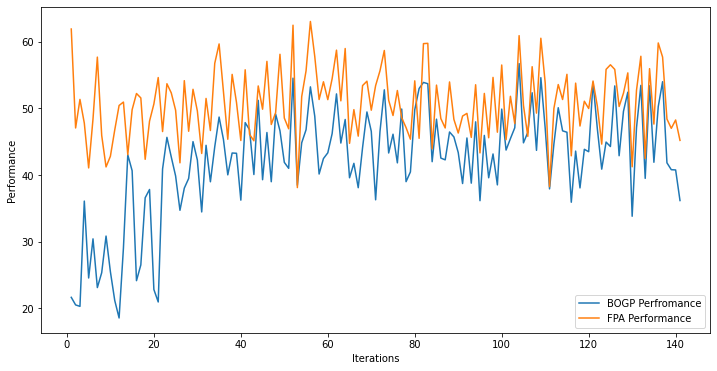

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=45.393902, actual=38.814
140


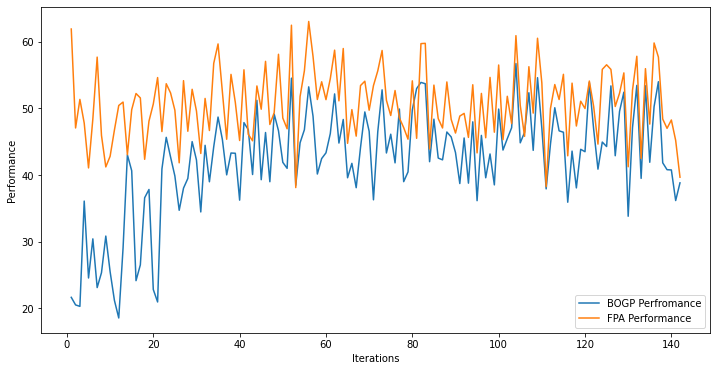

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=45.288886, actual=38.848
141


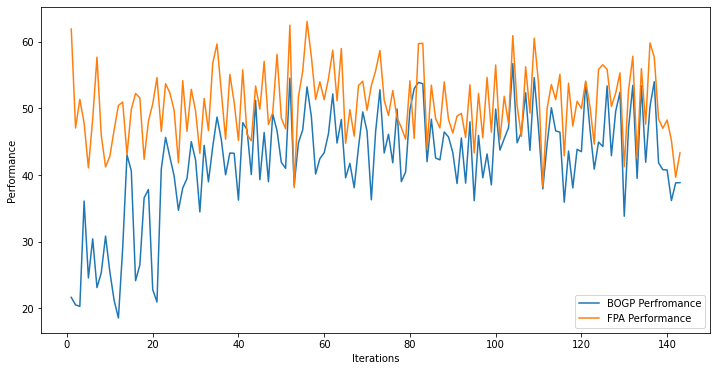

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=45.187871, actual=38.841
142


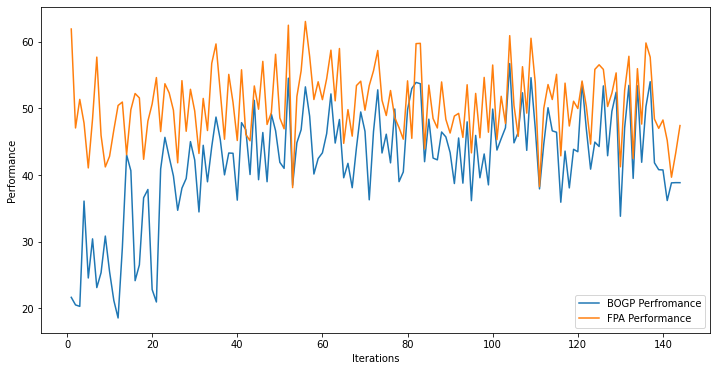

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -26.31932953  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=45.092599, actual=47.420
143


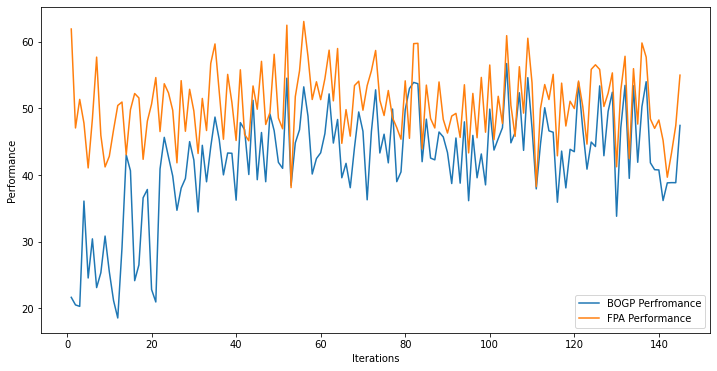

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -26.65655773  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=45.124694, actual=53.878
144


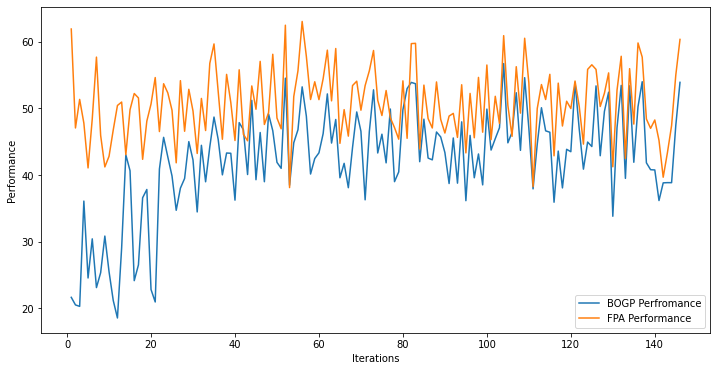

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -29.14180408  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=45.242517, actual=57.957
145


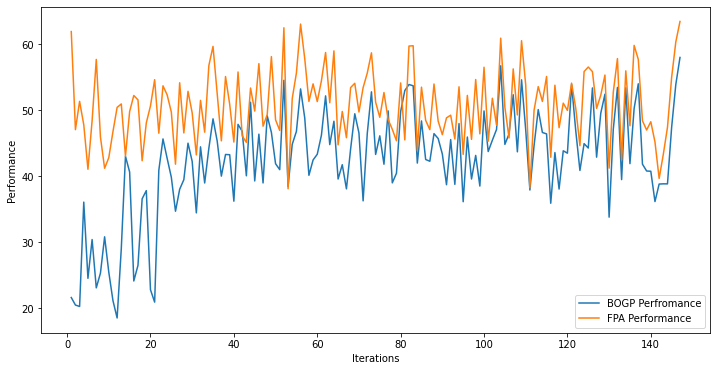

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=45.421429, actual=45.840
146


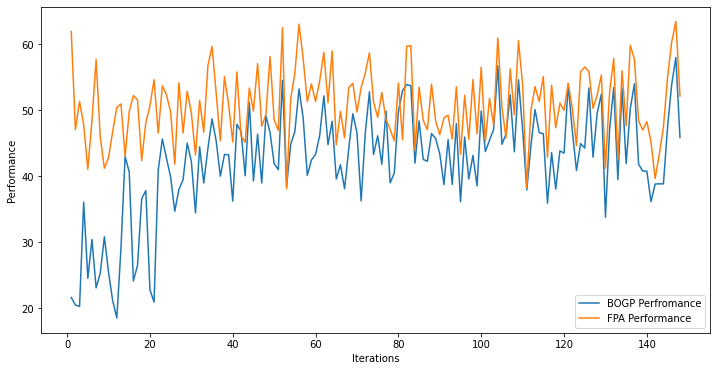

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=45.427902, actual=39.062
147


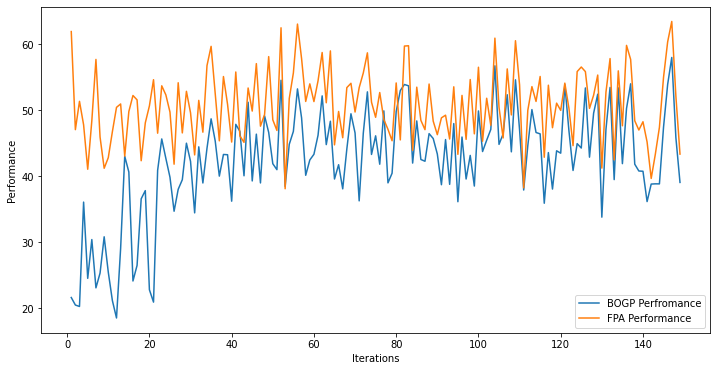

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=45.336367, actual=49.918
148


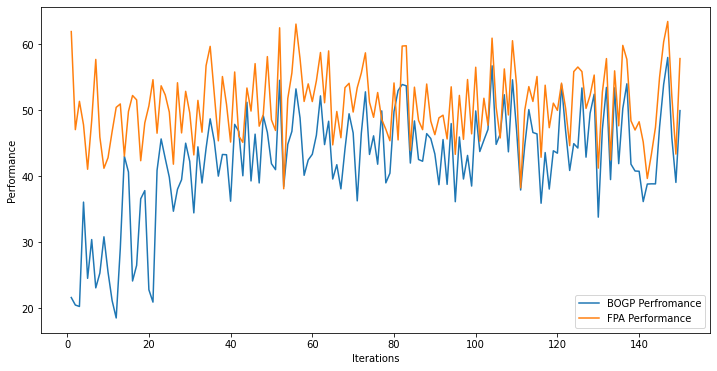

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=45.401204, actual=43.695
149


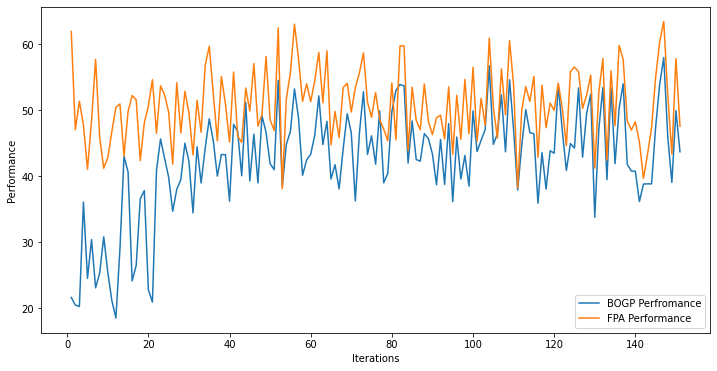

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=45.377704, actual=42.229
150


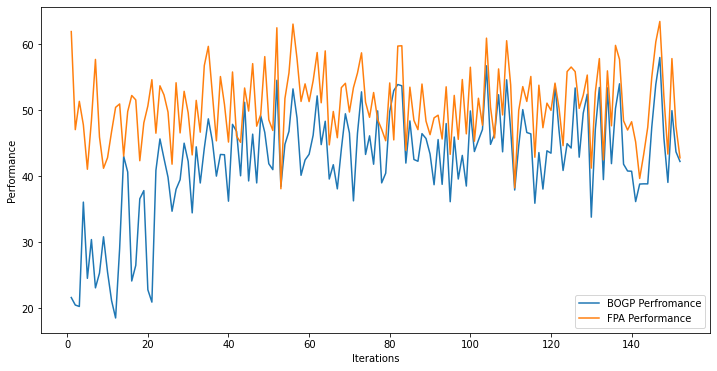

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=45.334575, actual=46.815
151


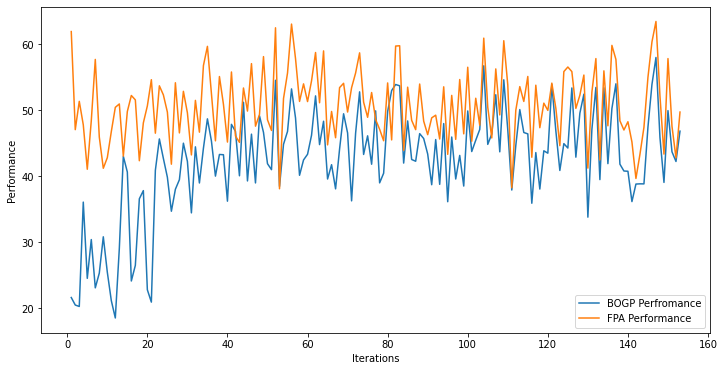

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.
 -31.  30.  30. -31. -31.  30.]
f()=45.354953, actual=37.470
152


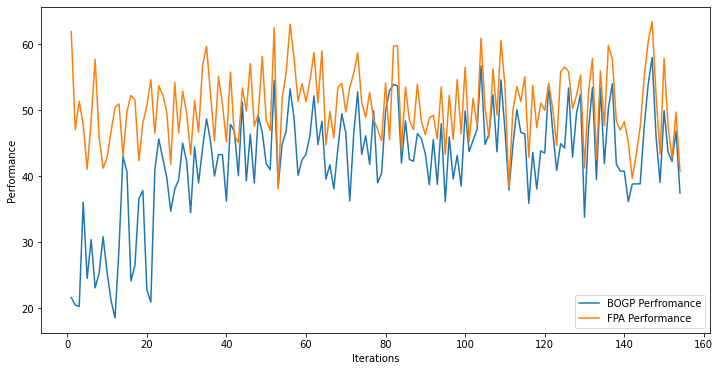

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -26.22700776  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=45.252061, actual=43.845
153


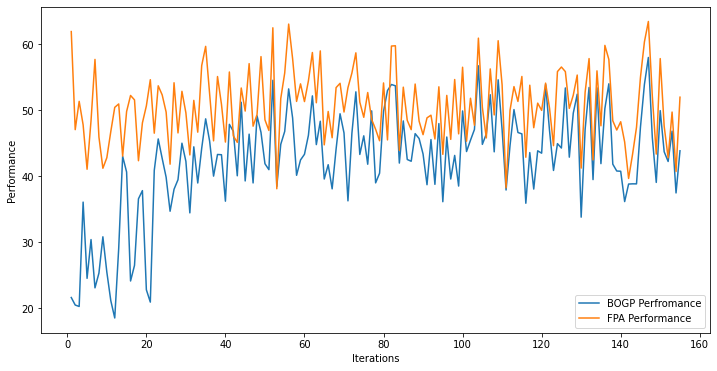

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -26.01756626  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=45.235637, actual=49.343
154


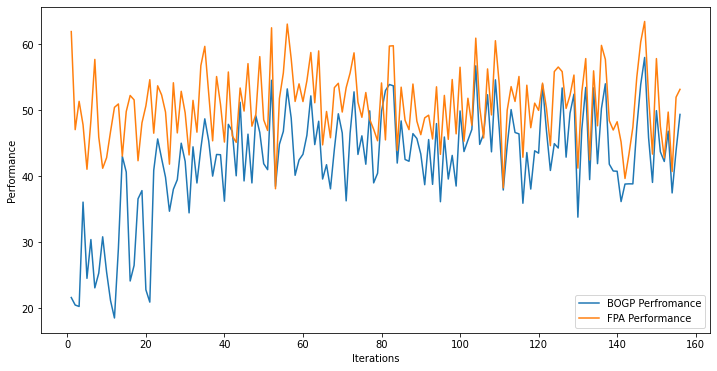

x_next is [ 30.         30.         30.         30.         30.         30.
  30.         30.         30.         30.         30.         30.
 -26.0413256  30.        -31.         30.         30.        -31.
 -31.         30.       ]
f()=45.284333, actual=44.379
155


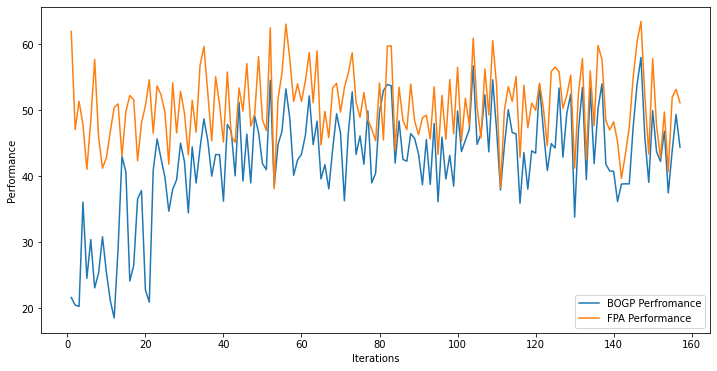

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -25.89018845  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=45.274185, actual=39.164
156


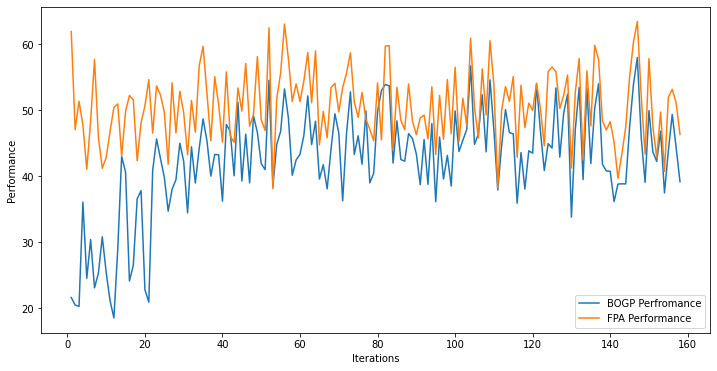

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -25.99684238  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=45.203423, actual=45.190
157


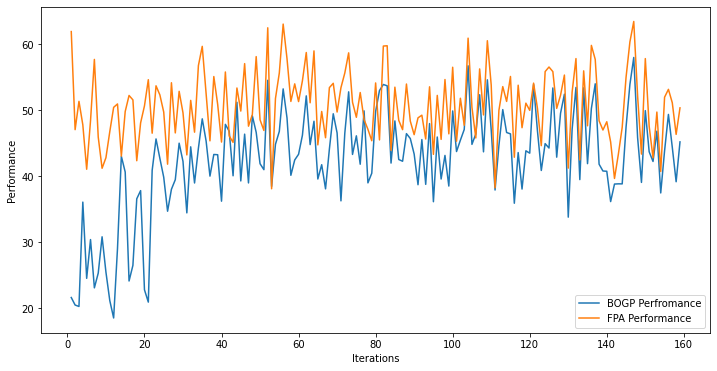

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -25.85304753  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=45.203679, actual=51.662
158


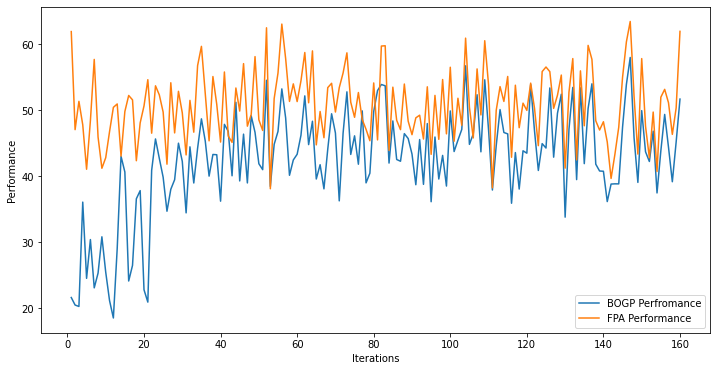

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -25.87171641  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=45.276286, actual=47.662
159


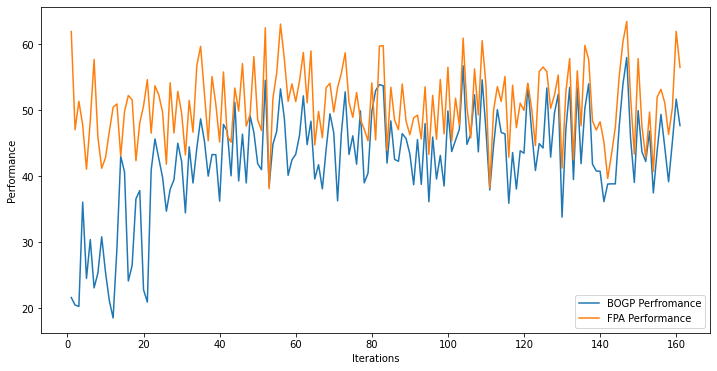

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -25.75131856  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=45.303237, actual=54.243
160


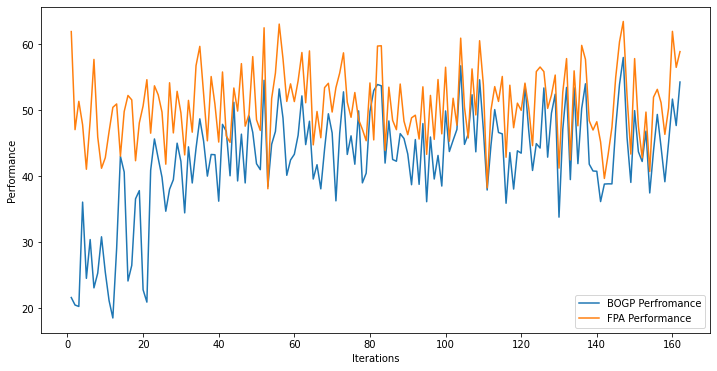

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -25.77205154  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=45.401057, actual=37.709
161


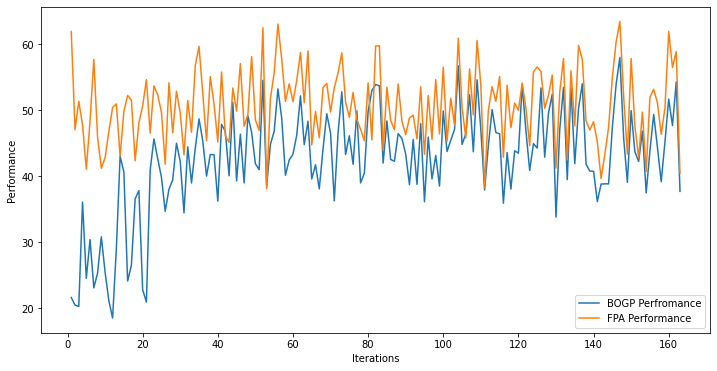

x_next is [-15.80383256  18.97020223 -16.96337687  -7.16825975  -0.13076257
  -8.5938826    8.67619258 -17.54731642 -14.99859137 -11.80973535
   9.92282571  -2.71912295  -4.81169947 -25.76038774 -23.62853345
  15.43621465 -24.49619947   1.81721173 -30.60860198  21.26115256]
f()=42.498345, actual=16.017
162


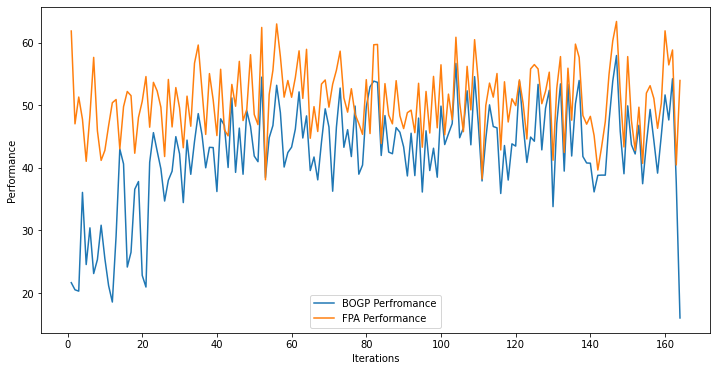

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -22.57684845  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=45.320222, actual=43.732
163


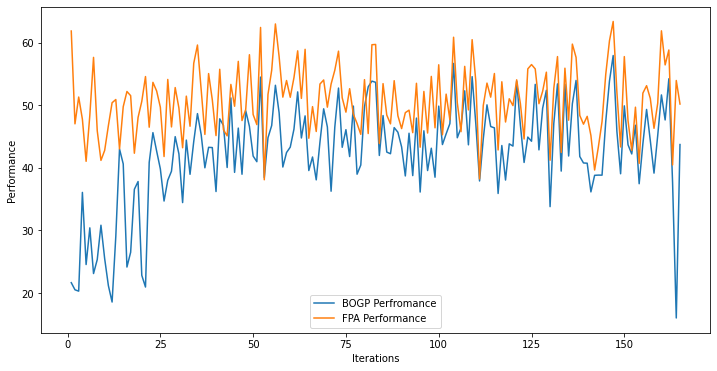

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -23.42570554  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=45.302726, actual=44.296
164


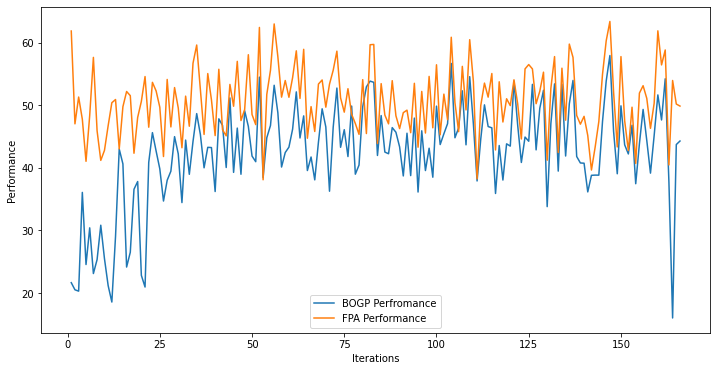

x_next is [ 30.         30.         30.         30.         30.         30.
  30.         30.         30.         30.         30.         30.
 -23.7380481  30.        -31.         30.         30.        -31.
 -31.         30.       ]
f()=45.292095, actual=41.854
165


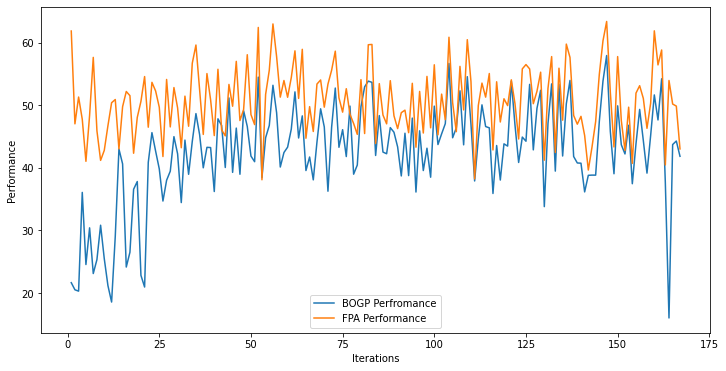

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -24.99754441  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=45.255405, actual=46.671
166


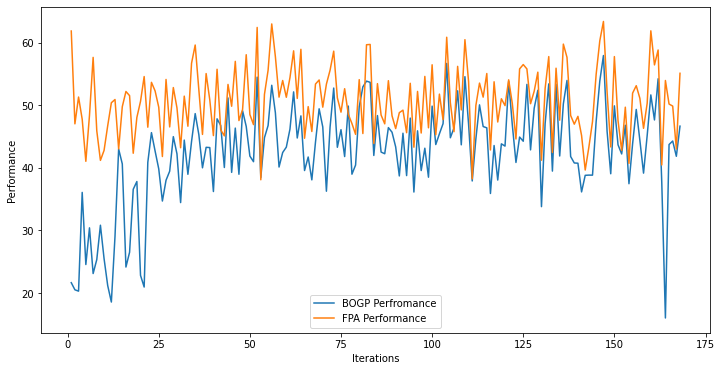

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -24.66455932  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=45.270609, actual=45.870
167


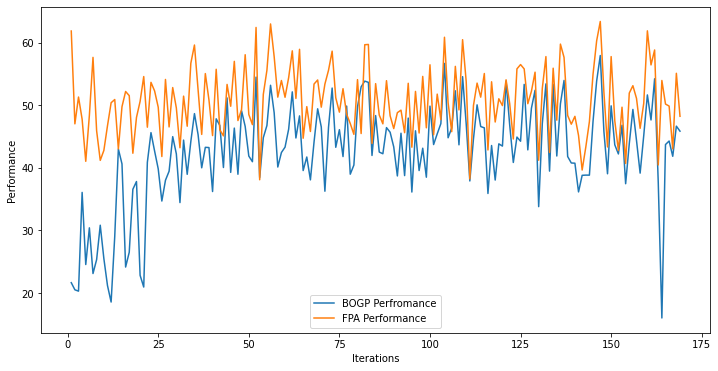

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -24.40622277  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=45.277224, actual=48.879
168


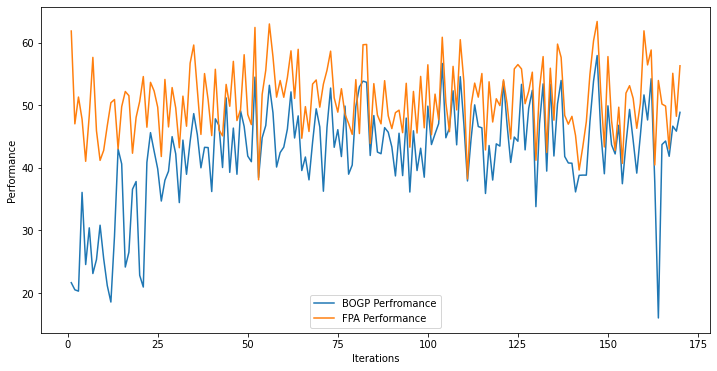

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -23.44261606  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=45.314817, actual=42.629
169


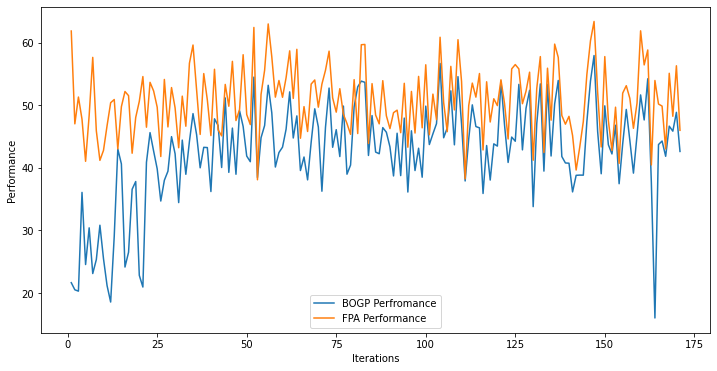

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -24.50333508  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=45.287245, actual=46.341
170


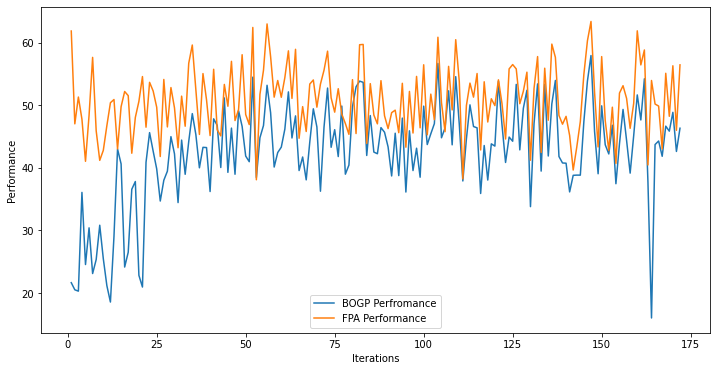

x_next is [ 30.         30.         30.         30.         30.         30.
  30.         30.         30.         30.         30.         30.
 -24.1414604  30.        -31.         30.         30.        -31.
 -31.         30.       ]
f()=45.298271, actual=35.669
171


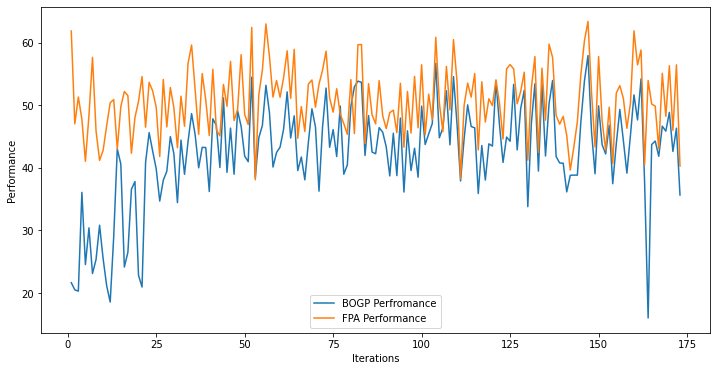

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -27.38543427  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=45.201679, actual=46.778
172


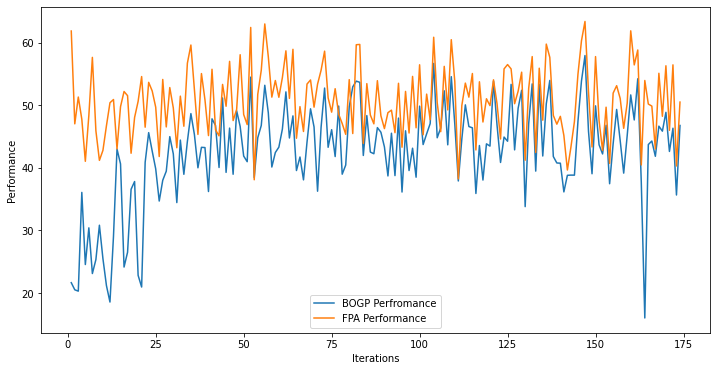

x_next is [ 30.         30.         30.         30.         30.         30.
  30.         30.         30.         30.         30.         30.
 -27.7538783  30.        -31.         30.         30.        -31.
 -31.         30.       ]
f()=45.217650, actual=48.120
173


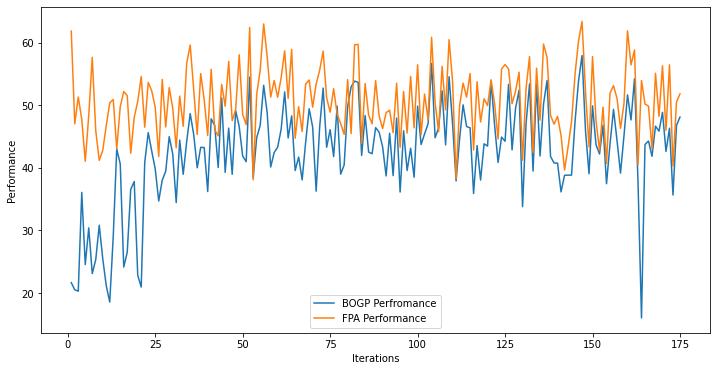

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -28.74307888  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=45.246832, actual=46.875
174


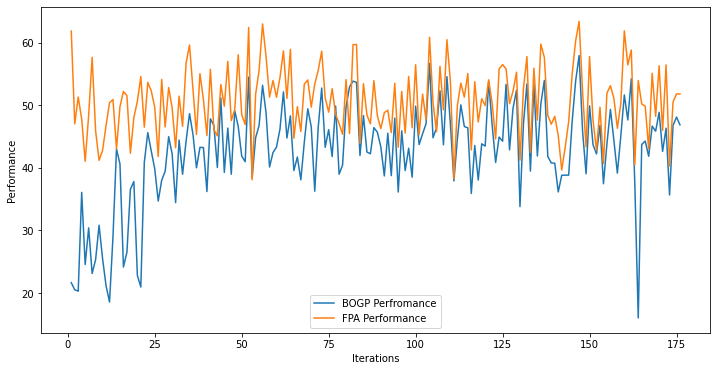

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -29.54913454  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=45.263546, actual=40.980
175


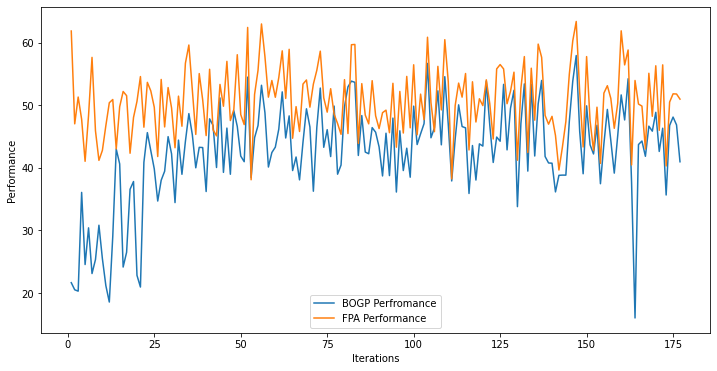

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -26.51388792  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=45.220811, actual=44.887
176


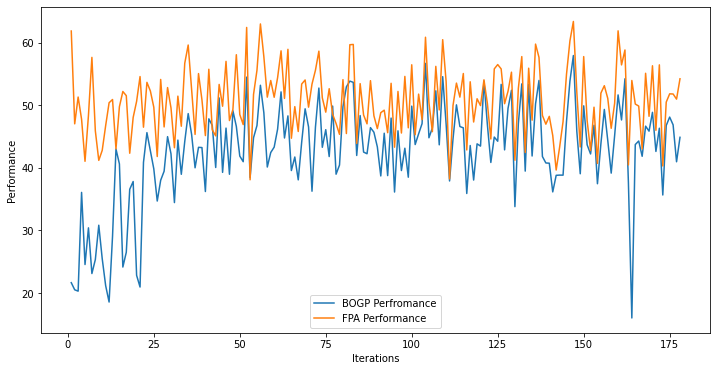

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -26.35252995  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=45.217883, actual=41.375
177


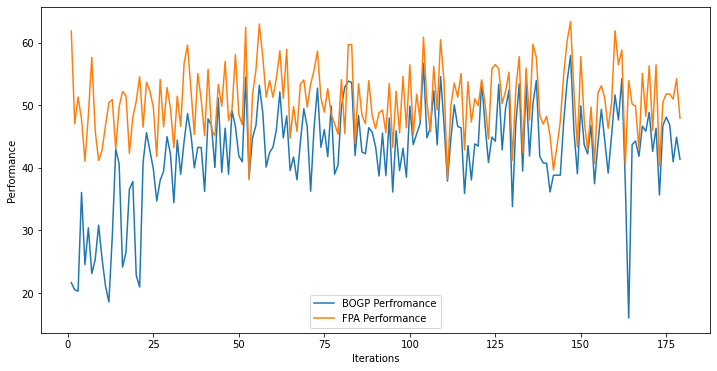

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -25.92735538  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=45.181857, actual=44.337
178


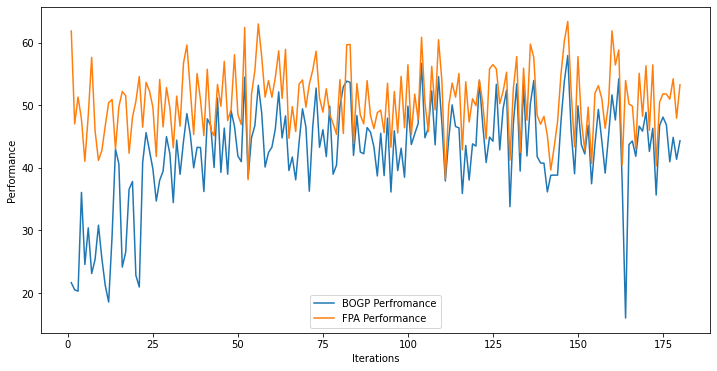

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -25.79012114  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=45.174233, actual=48.249
179


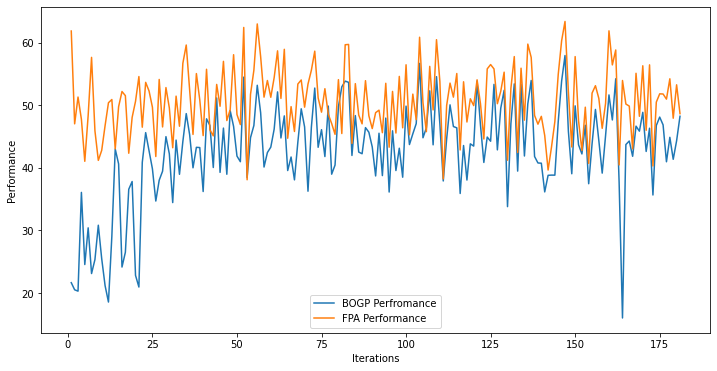

x_next is [ 30.         30.         30.         30.         30.         30.
  30.         30.         30.         30.         30.         30.
 -25.6885132  30.        -31.         30.         30.        -31.
 -31.         30.       ]
f()=45.202732, actual=46.938
180


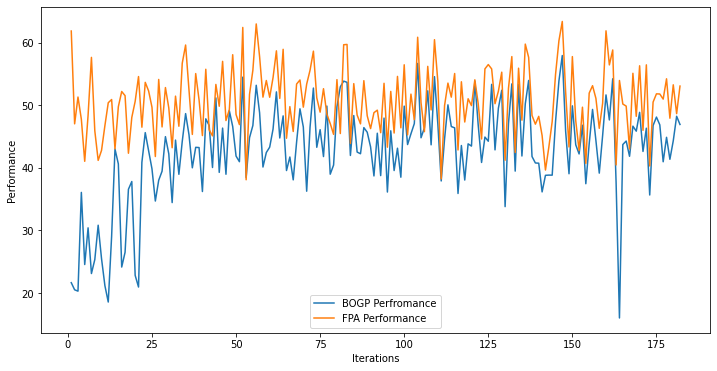

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -25.53523104  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=45.218812, actual=42.223
181


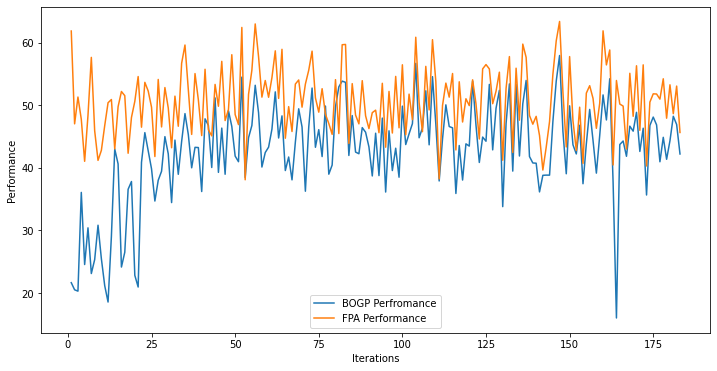

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -25.63111403  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=45.191823, actual=31.403
182


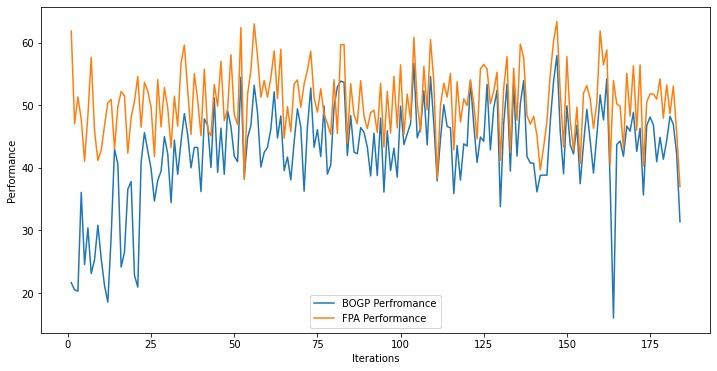

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -27.10601152  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=45.066771, actual=42.559
183


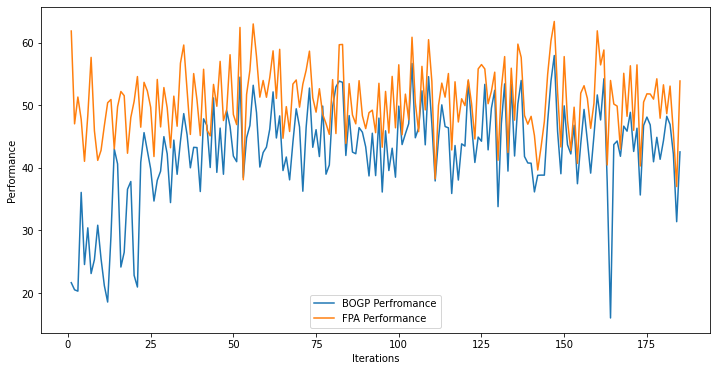

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -26.33967547  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=45.044491, actual=41.260
184


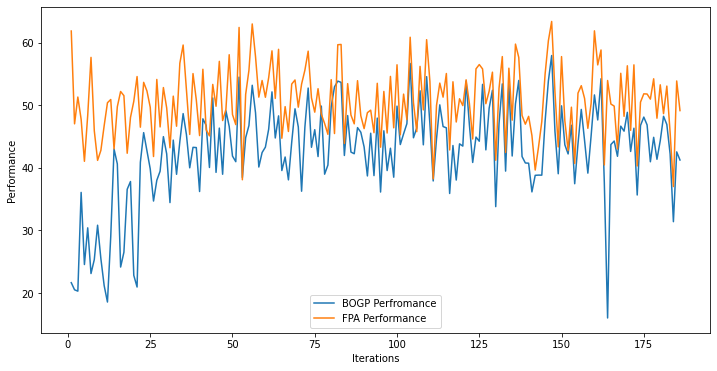

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -25.85870823  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=45.011233, actual=51.743
185


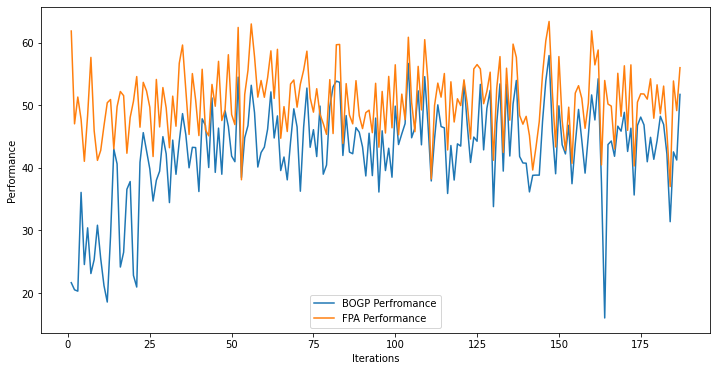

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -26.00271653  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=45.069814, actual=49.103
186


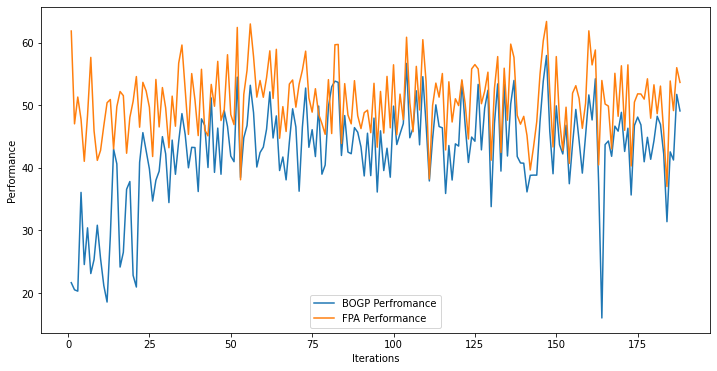

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -26.09049621  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=45.104800, actual=41.022
187


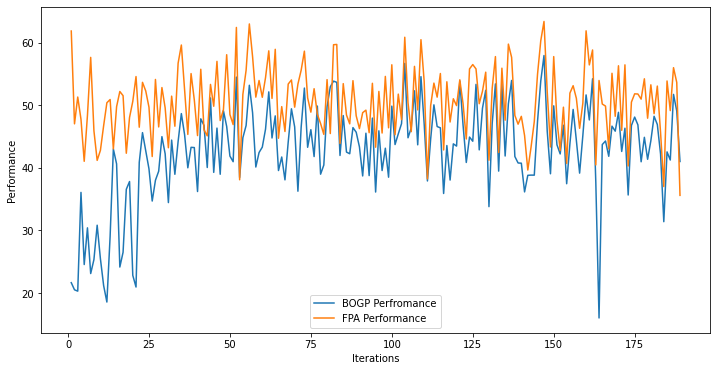

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -25.83575404  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=45.069833, actual=49.485
188


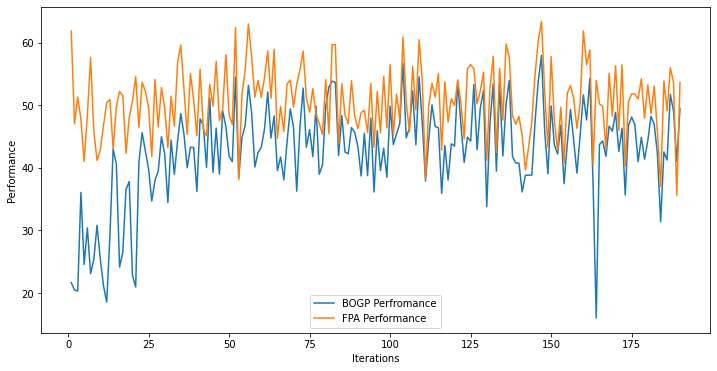

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -25.80372295  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=45.107434, actual=40.408
189


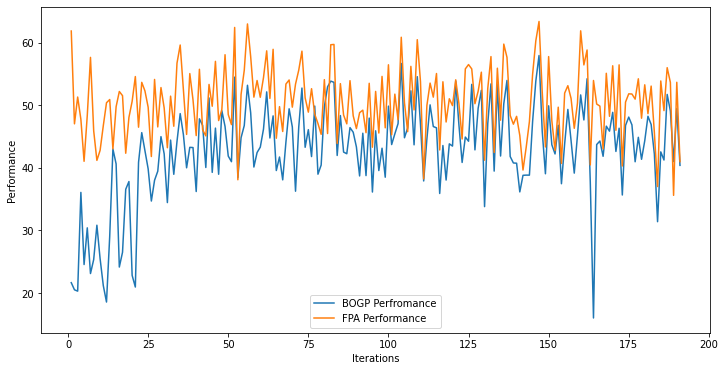

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -25.83054268  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=45.067807, actual=49.265
190


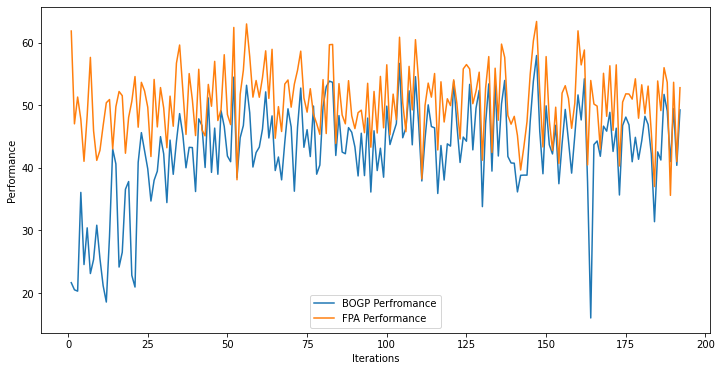

x_next is [ 30.         30.         30.         30.         30.         30.
  30.         30.         30.         30.         30.         30.
 -25.7763356  30.        -31.         30.         30.        -31.
 -31.         30.       ]
f()=45.102983, actual=45.720
191


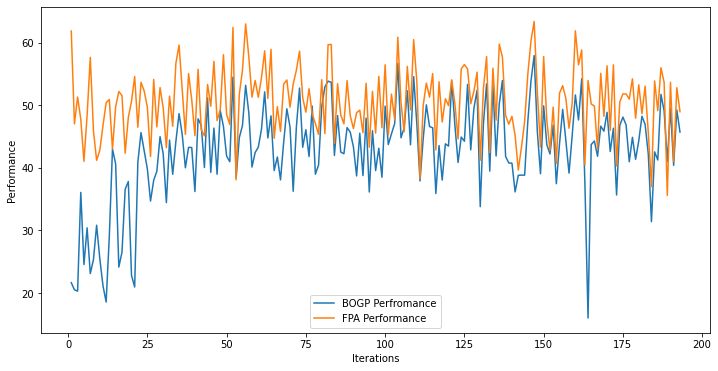

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.          30.
  30.          30.         -25.65151368  30.         -31.
  30.          30.         -31.         -31.          30.        ]
f()=45.108298, actual=47.036
192


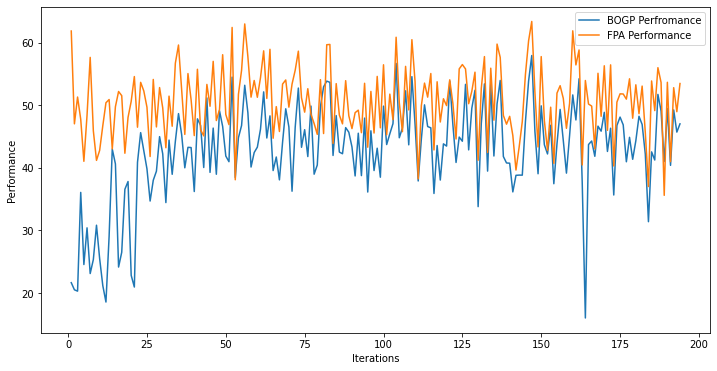

x_next is [ 29.99995038  29.99998631  29.99995323  29.99989238  29.99995664
  29.99991498  29.9998602   29.99994371  29.99998801  29.99995507
  29.99997816  29.99991234 -30.99994446  29.99975335 -30.99989387
  29.99999487  29.99997348 -30.99984434 -30.99988896  29.99995618]
f()=42.675448, actual=48.346
193


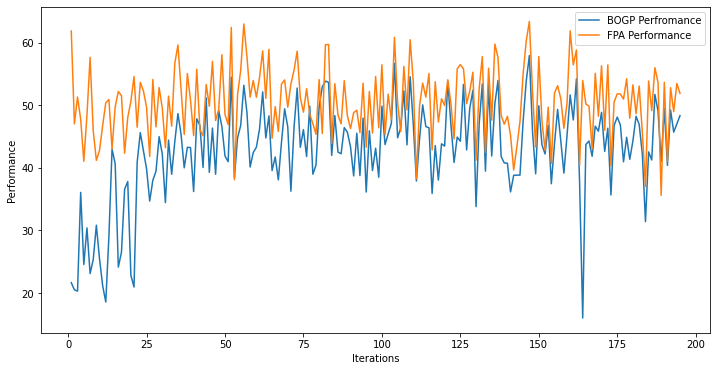

In [ ]:
from sklearn.gaussian_process.kernels import Matern, WhiteKernel, ConstantKernel

X = 0 * np.ones([1,var], dtype = "float")
y = np.array([[objective(X[0].reshape((int)(var/number_of_cells), number_of_cells))]])

tr_FPA = objective_FPA(P_max * np.ones([1,var], dtype = "float").reshape((int)(var/number_of_cells), number_of_cells))
y_FPA = np.array([[tr_FPA]])

kernels =  ConstantKernel(constant_value=200, constant_value_bounds = (1e-20, 1e20)) * Matern(length_scale=1, length_scale_bounds=(1e-20,1e20), nu=1.5) + WhiteKernel(noise_level=1, noise_level_bounds=(1e-20, 1e20)) 
model = GaussianProcessRegressor(kernel = kernels, n_restarts_optimizer=30)

model.fit(X, y)

for i in range(200):
  x_next = opt_acquisition(X, y, model, X.shape[0]+1)

  np.save("/content/drive/MyDrive/trainingx_BOGP_noisy_2.npy",X)
  np.save("/content/drive/MyDrive/trainingy_BOGP_noisy_2.npy",y)
  np.save("/content/drive/MyDrive/grad_trainingyFPA_BOGP_noisy_2.npy",y_FPA)
  
  tr = 0
  for l in range(1):
    tr = tr + objective(x_next.reshape((int)(var/number_of_cells), number_of_cells))
  tr = tr/1.0  
  actual = tr

  tr_FPA = objective_FPA(P_max * np.ones([1,var], dtype = "float").reshape((int)(var/number_of_cells), number_of_cells))
  
  est, _ = surrogate(model, [x_next])
  print("x_next is", x_next)
  print('f()=%3f, actual=%.3f' % (est, actual))
  
  X = vstack((X, [x_next]))
  y = vstack((y, [[actual]]))
  y_FPA = vstack((y_FPA, [[tr_FPA]]))
  
  model.fit(X, y)
  
  print(i)
  pyplot.figure(figsize = (12, 6))

  pyplot.xlabel("Iterations")
  pyplot.ylabel("Performance")
  pyplot.plot(np.arange(1,X.shape[0]+1),y[:])
  pyplot.plot(np.arange(1,X.shape[0]+1), y_FPA[:])
  pyplot.legend(["BOGP Perfromance","FPA Performance"])
  pyplot.show()


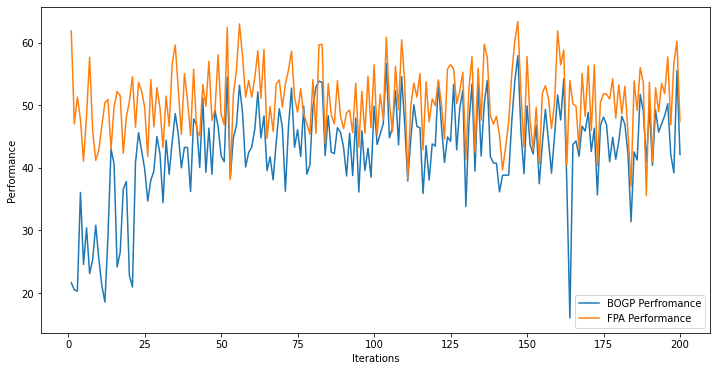

In [ ]:
pyplot.figure(figsize = (12, 6))   
pyplot.xlabel("Iterations")
pyplot.ylabel("Performance")
pyplot.plot(np.arange(1,X.shape[0]+1),y[:])
pyplot.plot(np.arange(1,X.shape[0]+1), y_FPA[:])
pyplot.legend(["BOGP Perfromance","FPA Performance"])
pyplot.show() 

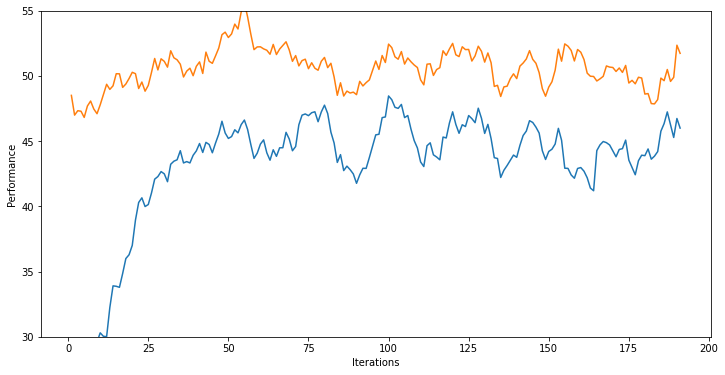

In [ ]:
MA = 10
pyplot.figure(figsize = (12, 6))
pyplot.xlabel("Iterations")
pyplot.ylabel("Performance")
pyplot.plot(np.arange(1,X.shape[0]+1-MA+1), np.convolve(y[:,0], np.ones(MA)/MA, mode='valid'))
pyplot.plot(np.arange(1,X.shape[0]+1-MA+1), np.convolve(y_FPA[:,0], np.ones(MA)/MA, mode='valid'))
pyplot.ylim([30,55])
pyplot.show()